In [1]:
!pip install joypy

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import altair as alt
import statsmodels.api as sm
from joypy import joyplot
from scipy.stats import ttest_ind
from scipy.stats import chi2_contingency

In [3]:
pwd

'/Users/sarahmokhtar/Downloads'

In [4]:
df=pd.read_csv('support2-1.csv')

In [5]:
df


,ID,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,...,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
0,1,62.84998,0,male,0,5,2029,Lung Cancer,Cancer,0,...,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,NaN,7.000000
1,2,60.33899,1,female,1,4,4,Cirrhosis,COPD/CHF/Cirrhosis,2,...,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,<2 mo. follow-up,1.000000
2,3,52.74698,1,female,0,17,47,Cirrhosis,COPD/CHF/Cirrhosis,2,...,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,<2 mo. follow-up,0.000000
3,4,42.38498,1,female,0,3,133,Lung Cancer,Cancer,2,...,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,no(M2 and SIP pres),0.000000
4,5,79.88495,0,female,0,16,2029,ARF/MOSF w/Sepsis,ARF/MOSF,1,...,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,no(M2 and SIP pres),2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9100,9101,66.07300,0,male,0,23,350,ARF/MOSF w/Sepsis,ARF/MOSF,1,...,1.099854,131.0,7.459961,188.0,21.0,NaN,NaN,0.0,NaN,0.000000
9101,9102,55.15399,0,female,0,29,347,Coma,Coma,1,...,5.899414,135.0,7.289062,190.0,49.0,0.0,NaN,0.0,NaN,0.000000
9102,9103,70.38196,0,male,0,8,346,ARF/MOSF w/Sepsis,ARF/MOSF,1,...,2.699707,139.0,7.379883,189.0,60.0,3900.0,NaN,NaN,NaN,2.525391
9103,9104,47.01999,1,male,1,7,7,MOSF w/Malig,ARF/MOSF,1,...,3.500000,135.0,7.469727,246.0,55.0,NaN,NaN,0.0,<2 mo. follow-up,0.000000


# Initial Data Analysis (IDA)

In [6]:
df.head()

,ID,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,...,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
0,1,62.84998,0,male,0,5,2029,Lung Cancer,Cancer,0,...,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,NaN,7.0
1,2,60.33899,1,female,1,4,4,Cirrhosis,COPD/CHF/Cirrhosis,2,...,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,<2 mo. follow-up,1.0
2,3,52.74698,1,female,0,17,47,Cirrhosis,COPD/CHF/Cirrhosis,2,...,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,<2 mo. follow-up,0.0
3,4,42.38498,1,female,0,3,133,Lung Cancer,Cancer,2,...,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,no(M2 and SIP pres),0.0
4,5,79.88495,0,female,0,16,2029,ARF/MOSF w/Sepsis,ARF/MOSF,1,...,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,no(M2 and SIP pres),2.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9105 entries, 0 to 9104
Data columns (total 48 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   ID        9105 non-null   int64  
 1   age       9105 non-null   float64
 2   death     9105 non-null   int64  
 3   sex       9105 non-null   object 
 4   hospdead  9105 non-null   int64  
 5   slos      9105 non-null   int64  
 6   d.time    9105 non-null   int64  
 7   dzgroup   9105 non-null   object 
 8   dzclass   9105 non-null   object 
 9   num.co    9105 non-null   int64  
 10  edu       7471 non-null   float64
 11  income    6123 non-null   object 
 12  scoma     9104 non-null   float64
 13  charges   8933 non-null   float64
 14  totcst    8217 non-null   float64
 15  totmcst   5630 non-null   float64
 16  avtisst   9023 non-null   float64
 17  race      9063 non-null   object 
 18  sps       9104 non-null   float64
 19  aps       9104 non-null   float64
 20  surv2m    9104 non-null   floa

In [8]:
print(df.shape)

(9105, 48)


# Checking for and handling any missing values

In [9]:
missing_percentage = (df.isnull().sum()/len(df)) * 100
print(missing_percentage)

ID           0.000000
age          0.000000
death        0.000000
sex          0.000000
hospdead     0.000000
slos         0.000000
d.time       0.000000
dzgroup      0.000000
dzclass      0.000000
num.co       0.000000
edu         17.946183
income      32.751236
scoma        0.010983
charges      1.889072
totcst       9.752883
totmcst     38.165843
avtisst      0.900604
race         0.461285
sps          0.010983
aps          0.010983
surv2m       0.010983
surv6m       0.010983
hday         0.000000
diabetes     0.000000
dementia     0.000000
ca           0.000000
prg2m       18.110928
prg6m       17.935200
dnr          0.329489
dnrday       0.329489
meanbp       0.010983
wblc         2.328391
hrt          0.010983
resp         0.010983
temp         0.010983
pafi        25.535420
alb         37.034596
bili        28.566722
crea         0.735859
sod          0.010983
ph          25.085118
glucose     49.423394
bun         47.797913
urine       53.399231
adlp        61.954970
adls      

In [10]:
# Handle missing values using recommendations from source website
df['alb'].fillna(3.5, inplace=True)     
df['pafi'].fillna(333.3, inplace=True)   
df['bili'].fillna(1.01, inplace=True)    
df['crea'].fillna(1.01, inplace=True)    
df['bun'].fillna(6.51, inplace=True)     
df['wblc'].fillna(9, inplace=True)       
df['urine'].fillna(2502, inplace=True)   

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/607206420.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['alb'].fillna(3.5, inplace=True)
/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/607206420.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a

In [11]:
# Non-critical columns with high levels of missing values were dropped
# to ensure data quality and focus the analysis on variables with sufficient values and relevance.
columns_to_drop = ['adlp', 'income', 'totmcst', 'adls']
df = df.drop(columns=columns_to_drop)

In [12]:
# Missing values were imputed to ensure a complete dataset.
 
# Numerical columns with a near normal distribution are imputed using the mean
cols_to_impute_mean = ['scoma', 'charges', 'avtisst', 'meanbp', 'hrt', 'resp', 'temp', 'sod']
for col in cols_to_impute_mean:
    df[col].fillna(df[col].mean(), inplace=True)

# Numerical columns with imbalances are imputed with median
cols_to_impute_median = ['totcst', 'prg2m', 'prg6m']
df.fillna(df[cols_to_impute_median].median(), inplace=True)
 
# Categorical columns are imputed using mode:    
cols_to_impute_mode = ['race', 'dnr', 'dnrday', 'sps', 'aps', 'surv2m', 'surv6m', 'edu', 'sfdm2']
for col in cols_to_impute_mode:
    df[col].fillna(df[col].mode()[0], inplace=True)

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3566248191.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace=True)
/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3566248191.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always 

In [13]:
# Impute missing values for critical numerical columns

critical_cols = ['glucose', 'ph']
for col in critical_cols:
    df[col].fillna(df[col].mean(), inplace = True)

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/29344237.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace = True)


In [14]:
#Confirming there are no missing values in the dataset 
print(df.isnull().sum())

ID          0
age         0
death       0
sex         0
hospdead    0
slos        0
d.time      0
dzgroup     0
dzclass     0
num.co      0
edu         0
scoma       0
charges     0
totcst      0
avtisst     0
race        0
sps         0
aps         0
surv2m      0
surv6m      0
hday        0
diabetes    0
dementia    0
ca          0
prg2m       0
prg6m       0
dnr         0
dnrday      0
meanbp      0
wblc        0
hrt         0
resp        0
temp        0
pafi        0
alb         0
bili        0
crea        0
sod         0
ph          0
glucose     0
bun         0
urine       0
sfdm2       0
adlsc       0
dtype: int64


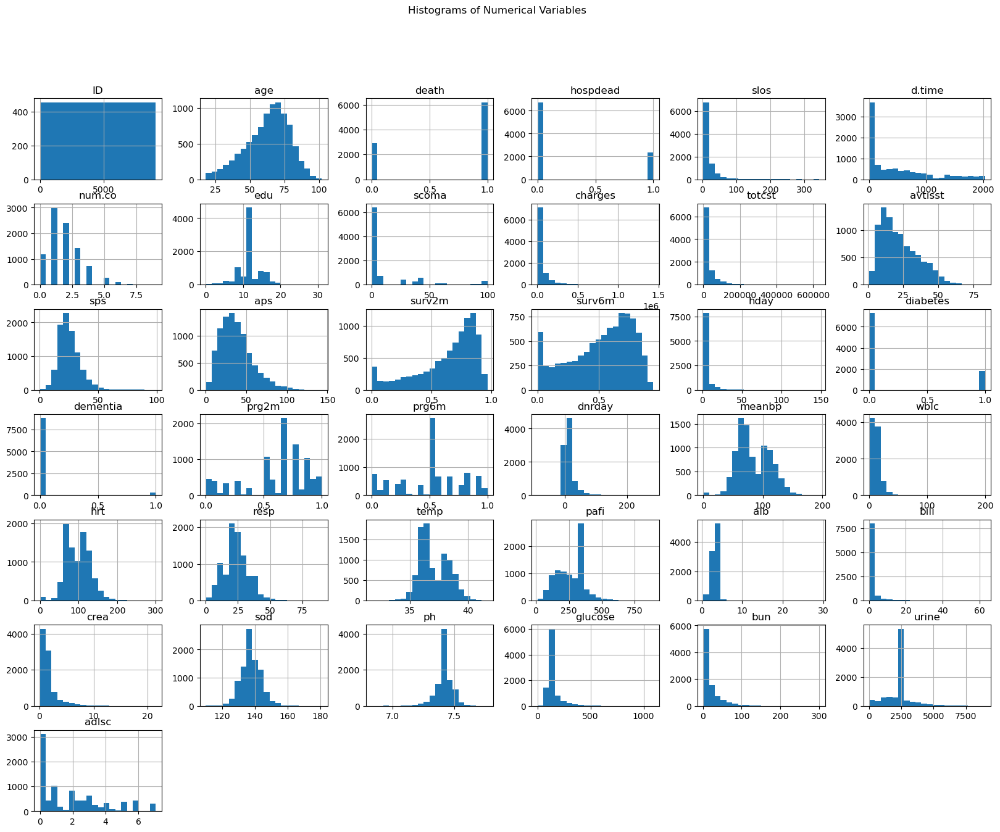

In [15]:
df.select_dtypes(include=['float64', 'int64']).hist(figsize=(20, 15), bins=20)
plt.suptitle('Histograms of Numerical Variables')
plt.show()

In [16]:
# Summary statistics for numerical columns
print(df.describe())

                ID          age        death     hospdead         slos  \
count  9105.000000  9105.000000  9105.000000  9105.000000  9105.000000   
mean   4553.000000    62.650823     0.681054     0.259198    17.863042   
std    2628.531434    15.593710     0.466094     0.438219    22.006440   
min       1.000000    18.041990     0.000000     0.000000     3.000000   
25%    2277.000000    52.797000     0.000000     0.000000     6.000000   
50%    4553.000000    64.856990     1.000000     0.000000    11.000000   
75%    6829.000000    73.998960     1.000000     1.000000    20.000000   
max    9105.000000   101.847960     1.000000     1.000000   343.000000   

            d.time       num.co          edu        scoma       charges  ...  \
count  9105.000000  9105.000000  9105.000000  9105.000000  9.105000e+03  ...   
mean    478.449863     1.868644    11.792971    12.058546  5.999579e+04  ...   
std     560.383272     1.344409     3.124552    24.635341  1.016745e+05  ...   
min       3.0

In [ ]:
# Summary statistics for categorical columns
print(df.describe(include='object'))

# Checking and handling outliers

In [17]:
# Identify columns with potential outliers
outliers = df.describe().loc['max'] > (df.describe().loc['75%'] * 1.5)
print(outliers[outliers])

slos        True
d.time      True
num.co      True
edu         True
scoma       True
charges     True
totcst      True
avtisst     True
sps         True
aps         True
hday        True
diabetes    True
dementia    True
dnrday      True
meanbp      True
wblc        True
hrt         True
resp        True
pafi        True
alb         True
bili        True
crea        True
glucose     True
bun         True
urine       True
adlsc       True
dtype: bool


In [18]:
# Calculate IQR and count the number of outliers for each numerical column
outlier_counts = {}
for col in df.columns:
    if col in df.describe().columns: 
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        outlier_counts[col] = len(outliers)

# Display columns with outliers and their counts
print({k: v for k, v in outlier_counts.items() if v > 0})

{'age': 56, 'slos': 768, 'd.time': 267, 'num.co': 25, 'edu': 3633, 'scoma': 1955, 'charges': 935, 'totcst': 911, 'avtisst': 48, 'sps': 283, 'aps': 178, 'surv2m': 303, 'hday': 1543, 'diabetes': 1778, 'dementia': 296, 'prg2m': 444, 'dnrday': 799, 'meanbp': 6, 'wblc': 431, 'hrt': 40, 'resp': 313, 'temp': 14, 'pafi': 59, 'alb': 154, 'bili': 1397, 'crea': 987, 'sod': 256, 'ph': 1107, 'glucose': 1691, 'bun': 916, 'urine': 2361}


In [20]:
# Cap outliers by replacing extreme values with upper/lower bounds
for col in ['slos', 'edu', 'scoma', 'alb', 'bili']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

In [21]:
# Unique values for categorical columns
print(df.select_dtypes(include='object').nunique())

sex        2
dzgroup    8
dzclass    4
race       5
ca         3
dnr        3
sfdm2      5
dtype: int64


In [22]:
# Display value counts for each categorical column
for col in ['sex', 'dzgroup', 'dzclass', 'race', 'ca', 'dnr', 'sfdm2']:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

Value counts for sex:
sex
male      5125
female    3980
Name: count, dtype: int64

Value counts for dzgroup:
dzgroup
ARF/MOSF w/Sepsis    3515
CHF                  1387
COPD                  967
Lung Cancer           908
MOSF w/Malig          712
Coma                  596
Colon Cancer          512
Cirrhosis             508
Name: count, dtype: int64

Value counts for dzclass:
dzclass
ARF/MOSF              4227
COPD/CHF/Cirrhosis    2862
Cancer                1420
Coma                   596
Name: count, dtype: int64

Value counts for race:
race
white       7233
black       1391
hispanic     290
other        112
asian         79
Name: count, dtype: int64

Value counts for ca:
ca
no            5995
metastatic    1858
yes           1252
Name: count, dtype: int64

Value counts for dnr:
dnr
no dnr             5910
dnr after sadm     2956
dnr before sadm     239
Name: count, dtype: int64

Value counts for sfdm2:
sfdm2
<2 mo. follow-up       4523
no(M2 and SIP pres)    3061
adl>=4 (>=5 if sur) 

In [23]:
# One-hot encode categorical variables and labvel 
df_encoded = pd.get_dummies(df, columns=['dzgroup', 'dzclass', 'race'])
ordinal_mapping = {'no dnr': 0, 'dnr after sadm': 1, 'dnr before sadm': 2}
df['dnr'] = df['dnr'].map(ordinal_mapping)

In [24]:
print(df_encoded.head())  

   ID       age  death     sex  hospdead  slos  d.time  num.co   edu  scoma  \
0   1  62.84998      0    male         0     5    2029       0  11.0    0.0   
1   2  60.33899      1  female         1     4       4       2  12.0   22.5   
2   3  52.74698      1  female         0    17      47       2  12.0    0.0   
3   4  42.38498      1  female         0     3     133       2  11.0    0.0   
4   5  79.88495      0  female         0    16    2029       1  12.0   22.5   

   ...  dzgroup_MOSF w/Malig  dzclass_ARF/MOSF  dzclass_COPD/CHF/Cirrhosis  \
0  ...                 False             False                       False   
1  ...                 False             False                        True   
2  ...                 False             False                        True   
3  ...                 False             False                       False   
4  ...                 False              True                       False   

   dzclass_Cancer  dzclass_Coma  race_asian  race_black 

In [25]:
# Confirm that each row belongs to exactly one category for each variable
print(df_encoded.filter(like='dzgroup_').sum(axis=1).unique())

[1]


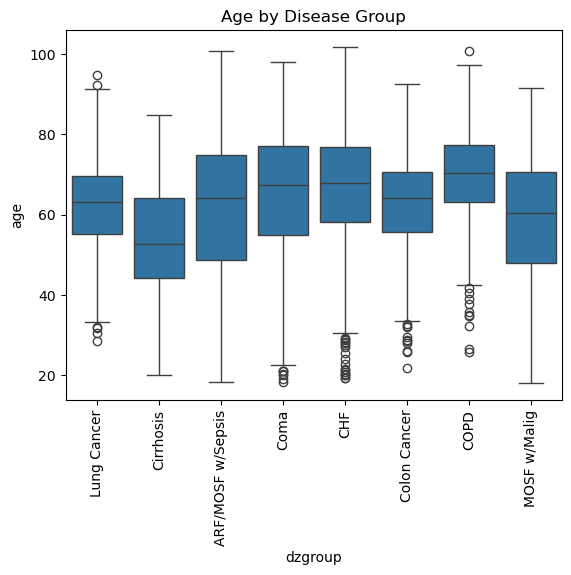

In [26]:
sns.boxplot(x='dzgroup', y='age', data=df)
plt.xticks(rotation=90)  
plt.title('Age by Disease Group')
plt.show()

# Checking for Duplicates

In [27]:
print(df.duplicated().sum())

0


In [28]:
print(df.dtypes)

ID            int64
age         float64
death         int64
sex          object
hospdead      int64
slos          int64
d.time        int64
dzgroup      object
dzclass      object
num.co        int64
edu         float64
scoma       float64
charges     float64
totcst      float64
avtisst     float64
race         object
sps         float64
aps         float64
surv2m      float64
surv6m      float64
hday          int64
diabetes      int64
dementia      int64
ca           object
prg2m       float64
prg6m       float64
dnr           int64
dnrday      float64
meanbp      float64
wblc        float64
hrt         float64
resp        float64
temp        float64
pafi        float64
alb         float64
bili        float64
crea        float64
sod         float64
ph          float64
glucose     float64
bun         float64
urine       float64
sfdm2        object
adlsc       float64
dtype: object


In [29]:
# Convert categorical columns to 'category' type to aid data handling
categorical_columns = ['sex', 'dzgroup', 'dzclass', 'race', 'ca', 'dnr', 'sfdm2']
for col in categorical_columns:
    df[col] = df[col].astype('category')

In [30]:
print(df.dtypes)

ID             int64
age          float64
death          int64
sex         category
hospdead       int64
slos           int64
d.time         int64
dzgroup     category
dzclass     category
num.co         int64
edu          float64
scoma        float64
charges      float64
totcst       float64
avtisst      float64
race        category
sps          float64
aps          float64
surv2m       float64
surv6m       float64
hday           int64
diabetes       int64
dementia       int64
ca          category
prg2m        float64
prg6m        float64
dnr         category
dnrday       float64
meanbp       float64
wblc         float64
hrt          float64
resp         float64
temp         float64
pafi         float64
alb          float64
bili         float64
crea         float64
sod          float64
ph           float64
glucose      float64
bun          float64
urine        float64
sfdm2       category
adlsc        float64
dtype: object


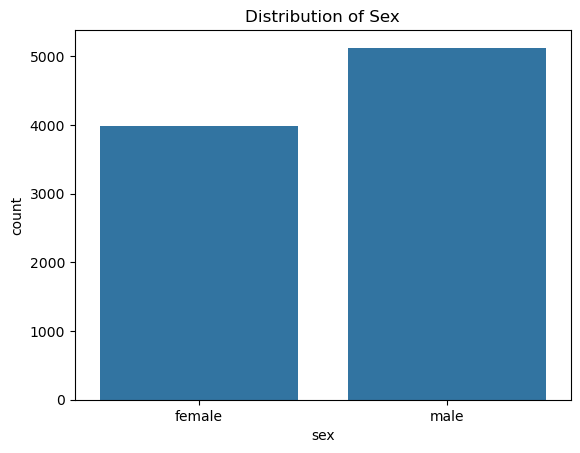

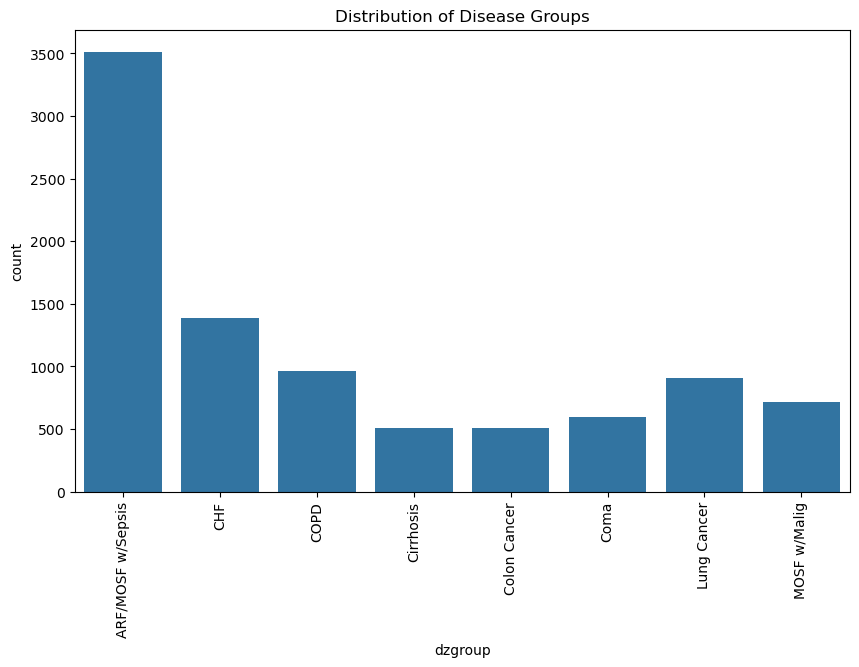

In [31]:
sns.countplot(x='sex', data=df)
plt.title('Distribution of Sex')
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(x='dzgroup', data=df)
plt.xticks(rotation=90) 
plt.title('Distribution of Disease Groups')
plt.show()

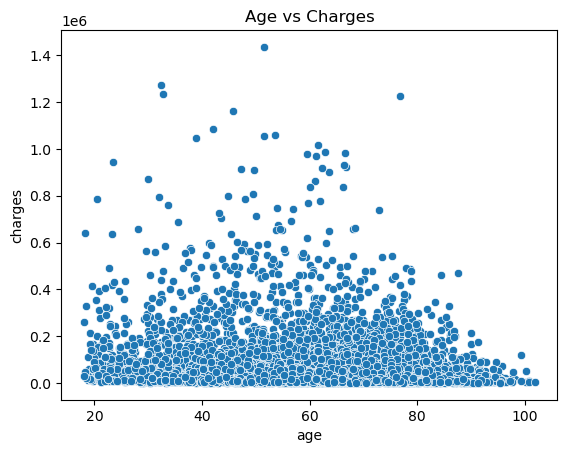

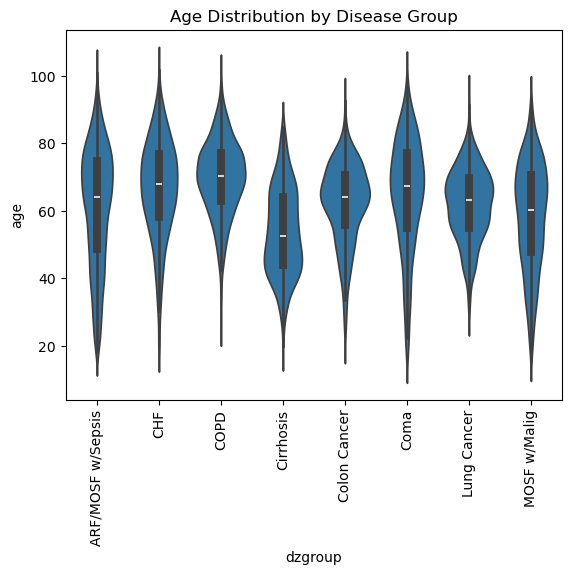

In [32]:
sns.scatterplot(x='age', y='charges', data=df)
plt.title('Age vs Charges')
plt.show()

sns.violinplot(x='dzgroup', y='age', data=df)
plt.xticks(rotation=90)  
plt.title('Age Distribution by Disease Group')
plt.show()

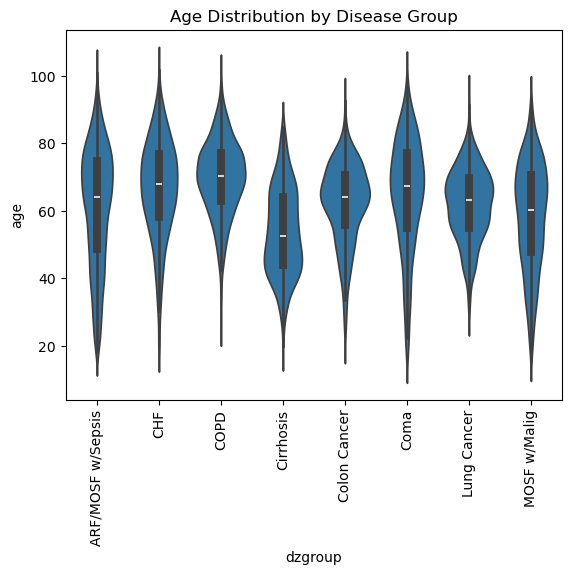

In [33]:
sns.violinplot(x='dzgroup', y='age', data=df)
plt.xticks(rotation=90)  
plt.title('Age Distribution by Disease Group')
plt.show()

# Hospital Costs Analysis

## 1. Hospital Costs vs. Survival Probability (Interactive Scatter Plot using Plotly)

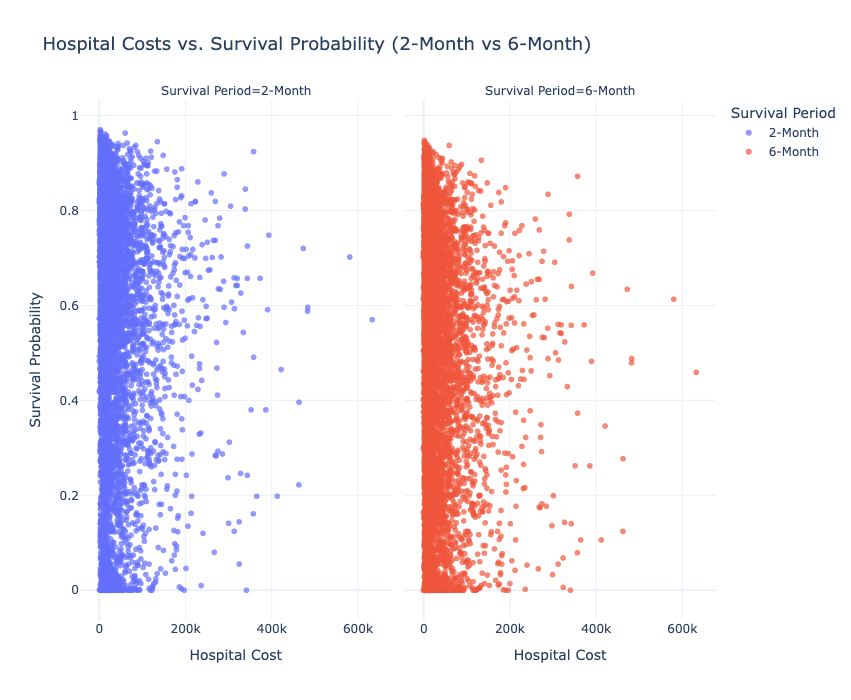

In [34]:
if 'totcst' in df.columns and 'surv2m' in df.columns and 'surv6m' in df.columns:
    df_2m = df[['totcst', 'surv2m']].rename(columns={'surv2m': 'Survival Probability'})
    df_2m['Survival Period'] = '2-Month'

    df_6m = df[['totcst', 'surv6m']].rename(columns={'surv6m': 'Survival Probability'})
    df_6m['Survival Period'] = '6-Month'

    df_combined = pd.concat([df_2m, df_6m])

    fig = px.scatter(df_combined, x='totcst', y='Survival Probability',
                     title='Hospital Costs vs. Survival Probability (2-Month vs 6-Month)',
                     labels={'totcst': 'Hospital Cost', 'Survival Probability': 'Survival Probability'},
                     facet_col='Survival Period',  
                     color='Survival Period',
                     hover_data=['totcst'])

    fig.update_traces(marker=dict(size=6, opacity=0.7))
    fig.update_layout(
        template='plotly_white',
        xaxis_title='Hospital Cost',
        yaxis_title='Survival Probability',
        title_font=dict(size=18),
        height=700,  
        width=1200   
    )

    fig.show()

## 2. Hospital Costs by Survival Status

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/1146834453.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




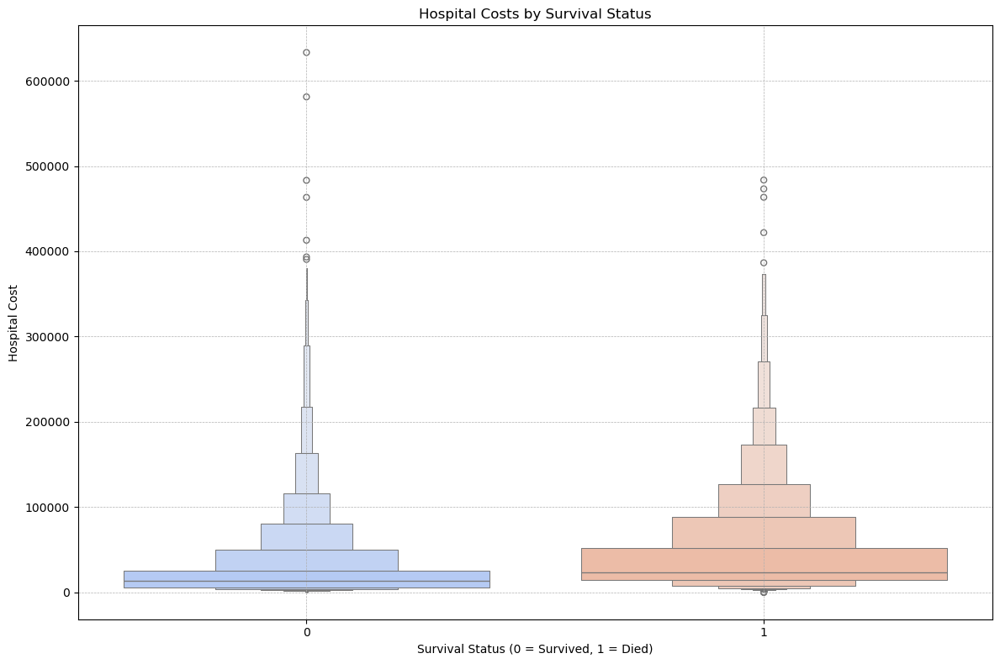

In [35]:
plt.figure(figsize=(12, 8))

sns.boxenplot(data=df, x='hospdead', y='totcst', palette='coolwarm')

plt.title('Hospital Costs by Survival Status')
plt.xlabel('Survival Status (0 = Survived, 1 = Died)')
plt.ylabel('Hospital Cost')
plt.grid(visible=True, linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()

## 3. Hospital Costs by Disease Group 

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3053166359.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



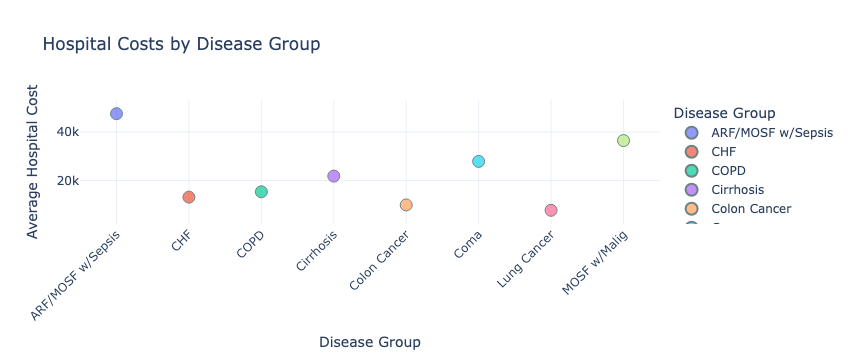

In [36]:
if 'dzgroup' in df.columns and 'totcst' in df.columns:
    avg_cost_by_dzgroup = df.groupby('dzgroup')['totcst'].mean().reset_index()

    fig = px.scatter(avg_cost_by_dzgroup, x='dzgroup', y='totcst',
                     title='Hospital Costs by Disease Group',
                     labels={'dzgroup': 'Disease Group', 'totcst': 'Average Hospital Cost'},
                     color='dzgroup', size='totcst', hover_name='dzgroup')

    fig.update_traces(marker=dict(size=12, opacity=0.7, line=dict(width=1, color='DarkSlateGrey')))
    fig.update_layout(
        xaxis_title='Disease Group',
        yaxis_title='Average Hospital Cost',
        template='plotly_white',
        xaxis_tickangle=-45
    )

    fig.show()

## 4. Correlation Between Hospital Costs and Length of Stay

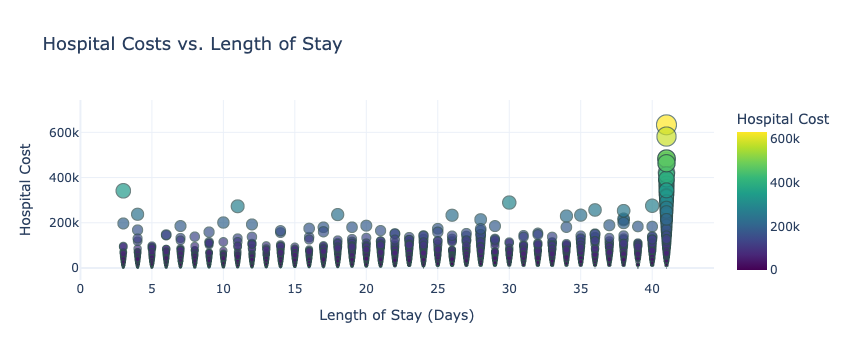

In [37]:
if 'slos' in df.columns and 'totcst' in df.columns:
    fig = px.scatter(df, x='slos', y='totcst',
                     title='Hospital Costs vs. Length of Stay',
                     labels={'slos': 'Length of Stay (Days)', 'totcst': 'Hospital Cost'},
                     color='totcst',  
                     size='totcst',  
                     hover_data=['slos', 'totcst'],
                     color_continuous_scale='Viridis')  

    fig.update_traces(marker=dict(opacity=0.7, line=dict(width=1, color='DarkSlateGrey')))
    
    fig.update_layout(
        xaxis_title='Length of Stay (Days)',
        yaxis_title='Hospital Cost',
        template='plotly_white',
        xaxis_tickangle=0,
        title_font=dict(size=18)
    )

    fig.show()

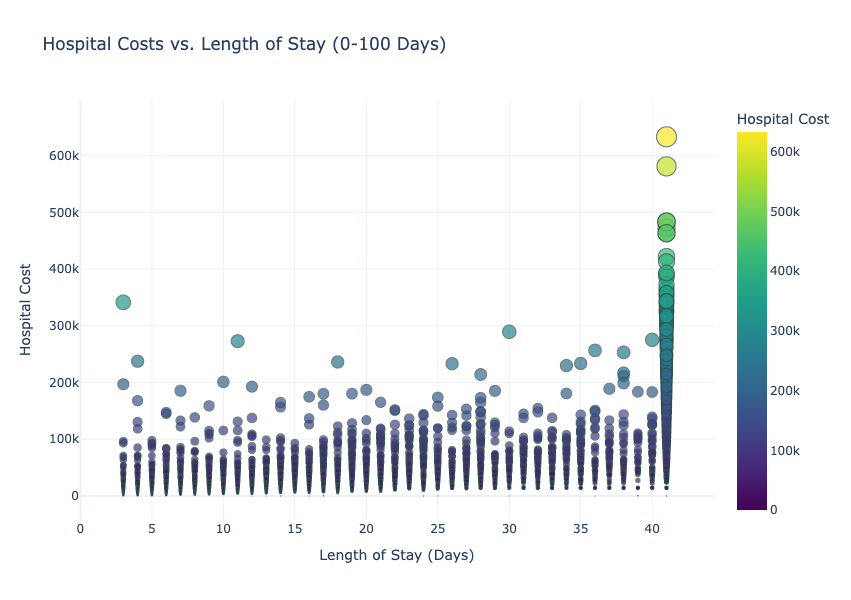

In [98]:
df_zoomed = df[(df['slos'] >= 0) & (df['slos'] <= 100)]

if 'slos' in df_zoomed.columns and 'totcst' in df_zoomed.columns:
    fig_zoom = px.scatter(df_zoomed, x='slos', y='totcst',
                          title='Hospital Costs vs. Length of Stay (0-100 Days)',
                          labels={'slos': 'Length of Stay (Days)', 'totcst': 'Hospital Cost'},
                          color='totcst', 
                          size='totcst',  
                          hover_data=['slos', 'totcst'],
                          color_continuous_scale='Viridis')

    fig_zoom.update_traces(marker=dict(opacity=0.7, line=dict(width=1, color='DarkSlateGrey')))
    
    fig_zoom.update_layout(
        xaxis_title='Length of Stay (Days)',
        yaxis_title='Hospital Cost',
        template='plotly_white',
        height=600,
        width=1000
    )

    fig_zoom.show()

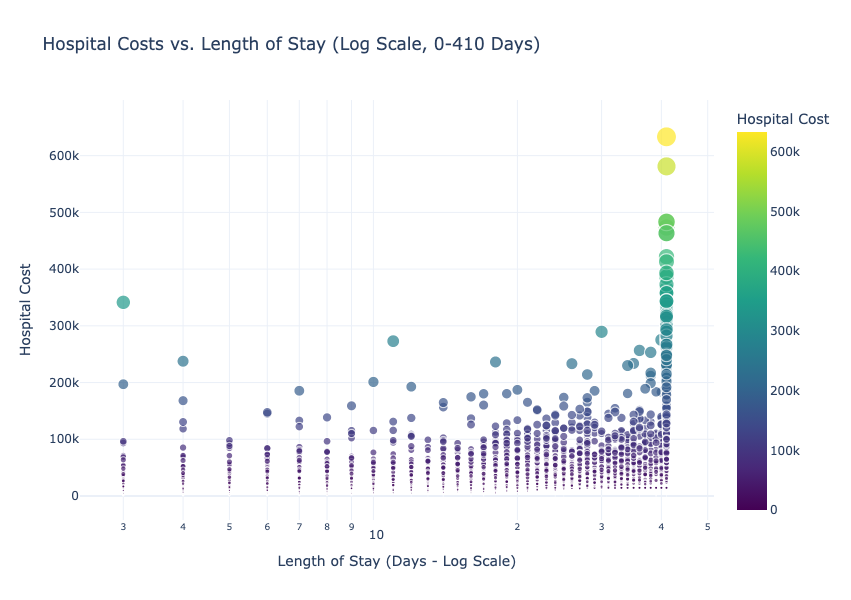

In [100]:
df_filtered = df[(df['slos'] >= 0) & (df['slos'] <= 410)]

if 'slos' in df_filtered.columns and 'totcst' in df_filtered.columns:
    fig_filtered_log = px.scatter(df_filtered, x='slos', y='totcst',
                                  title='Hospital Costs vs. Length of Stay (Log Scale, 0-410 Days)',
                                  labels={'slos': 'Length of Stay (Days - Log Scale)', 'totcst': 'Hospital Cost'},
                                  color='totcst',
                                  size='totcst',
                                  hover_data=['slos', 'totcst'],
                                  color_continuous_scale='Viridis')

    fig_filtered_log.update_layout(
        xaxis_type='log', 
        template='plotly_white',
        xaxis_title='Length of Stay (Days - Log Scale)',
        yaxis_title='Hospital Cost',
        height=600,
        width=1000
    )

    fig_filtered_log.show()

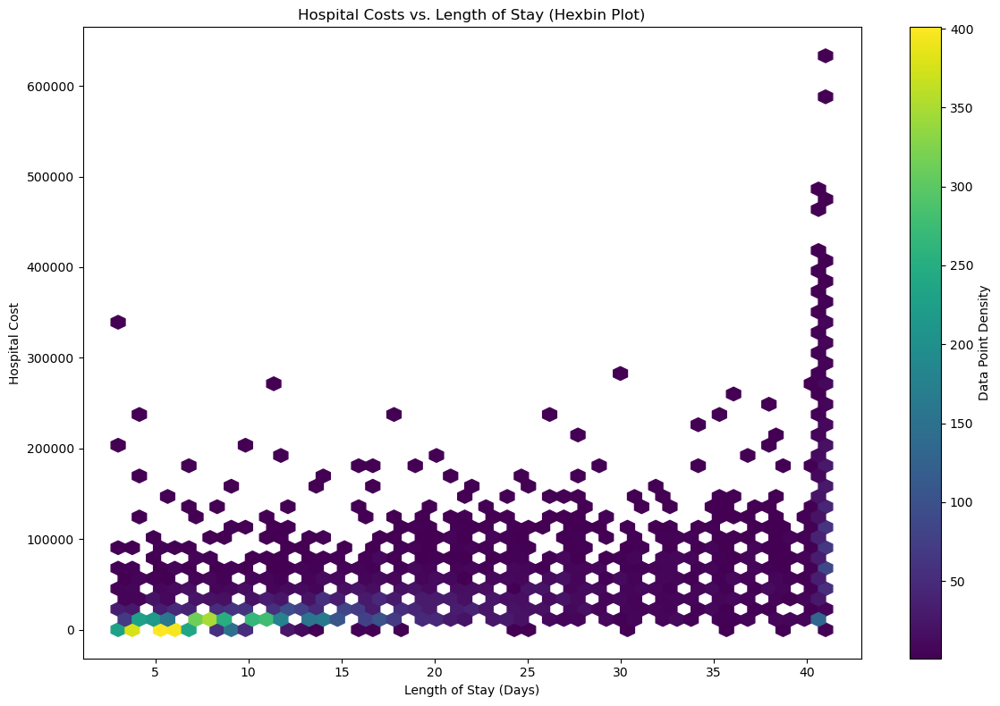

In [40]:
plt.figure(figsize=(12, 8))
plt.hexbin(df['slos'], df['totcst'], gridsize=50, cmap='viridis', mincnt=1)

plt.title('Hospital Costs vs. Length of Stay (Hexbin Plot)')
plt.xlabel('Length of Stay (Days)')
plt.ylabel('Hospital Cost')
plt.colorbar(label='Data Point Density')

plt.tight_layout()
plt.show()

## 5. Hospital Costs by Age Group

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/1043868374.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



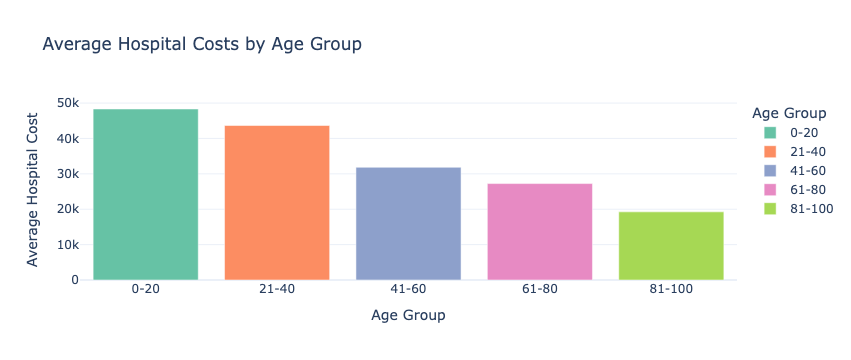

In [41]:
bins = [0, 20, 40, 60, 80, 100]
labels = ['0-20', '21-40', '41-60', '61-80', '81-100']
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

df['totcst'] = pd.to_numeric(df.get('totcst', pd.Series([0]*len(df))), errors='coerce').fillna(0)

grouped_df = df.groupby('age_group')['totcst'].mean().reset_index()

bar_fig = px.bar(
    grouped_df,
    x='age_group',
    y='totcst',
    title= 'Average Hospital Costs by Age Group',
    labels={'age_group':'Age Group', 'totcst': 'Average Hospital Cost'},
    color='age_group',
    color_discrete_sequence=px.colors.qualitative.Set2
)

bar_fig.update_layout(
    xaxis_title='Age Group',
    yaxis_title='Average Hospital Cost',
    template = 'plotly_white',
    xaxis_tickangle=0
)

bar_fig.show()

## 6. Hospital Costs vs. Comorbidity

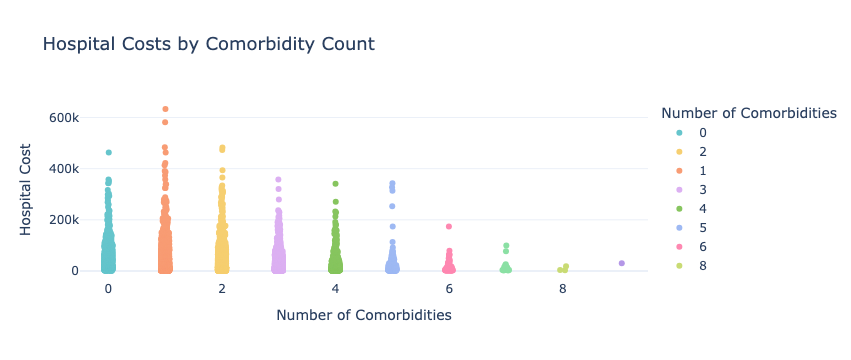

In [42]:
if 'num.co' in df.columns and 'totcst' in df.columns:
    fig = px.strip(df, x='num.co', y='totcst',
                   title='Hospital Costs by Comorbidity Count',
                   labels={'num.co': 'Number of Comorbidities', 'totcst': 'Hospital Cost'},
                   color='num.co',
                   color_discrete_sequence=px.colors.qualitative.Pastel)

    fig.update_layout(
        xaxis_title='Number of Comorbidities',
        yaxis_title='Hospital Cost',
        template='plotly_white',
        xaxis_tickangle=0,
        title_font=dict(size=18)
    )

    fig.show()

## 7. Hospital Costs by Gender

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/2438644585.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



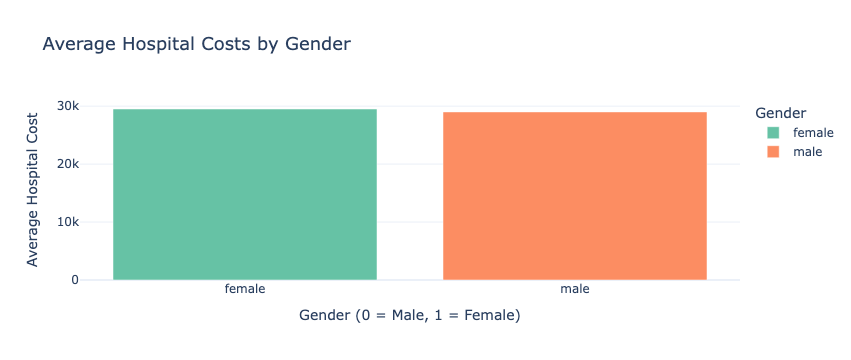

In [43]:
if 'sex' in df.columns and 'totcst' in df.columns:
    avg_cost_by_gender = df.groupby('sex')['totcst'].mean().reset_index()

    fig = px.bar(avg_cost_by_gender, x='sex', y='totcst',
                 title='Average Hospital Costs by Gender',
                 labels={'sex': 'Gender', 'totcst': 'Average Hospital Cost'},
                 color='sex',
                 color_discrete_sequence=px.colors.qualitative.Set2)

    fig.update_layout(
        xaxis_title='Gender (0 = Male, 1 = Female)',
        yaxis_title='Average Hospital Cost',
        template='plotly_white',
        xaxis_tickangle=0,
        title_font=dict(size=18)
    )

    fig.show()

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/2711742195.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/Users/sarahmokhtar/Applications/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning:

6.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/sarahmokhtar/Applications/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning:

8.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/sarahmokhtar/Applications/anaconda3/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning:

14.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



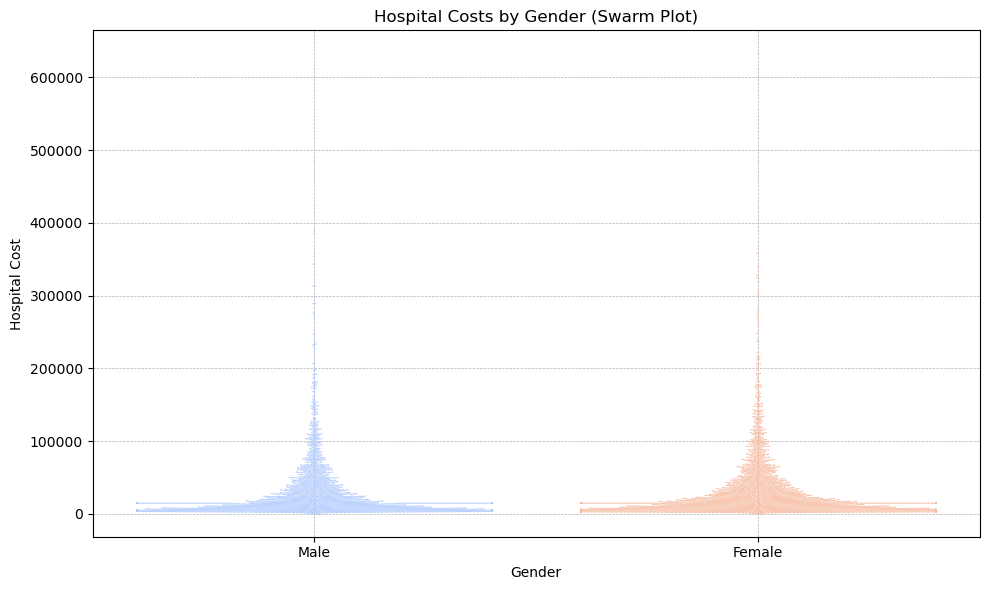

In [44]:
plt.figure(figsize=(10, 6))

sns.swarmplot(data=df, x='sex', y='totcst', palette='coolwarm', size=0.9)
plt.xticks([0, 1], ['Male', 'Female'])  

plt.title('Hospital Costs by Gender (Swarm Plot)')
plt.xlabel('Gender')
plt.ylabel('Hospital Cost')
plt.grid(visible=True, linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()

# Survival Analysis

## 1. Survival Probability by Disease Class

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3998324707.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



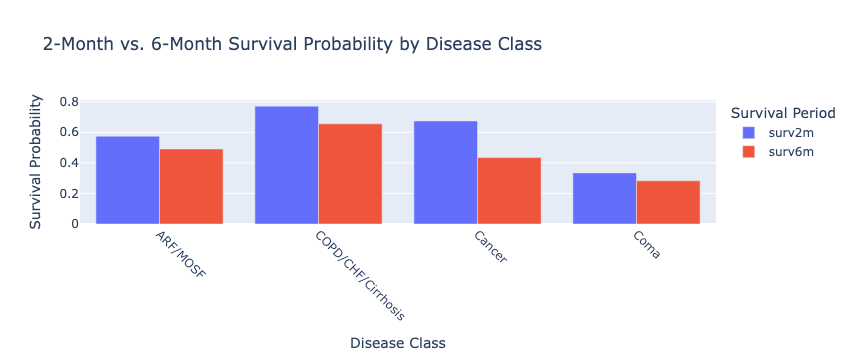

In [45]:
survival_by_disease = df.groupby('dzclass')[['surv2m', 'surv6m']].mean().reset_index()
survival_long = pd.melt(survival_by_disease, id_vars=['dzclass'], value_vars=['surv2m', 'surv6m'], 
                        var_name='Survival Period', value_name='Survival Probability')

fig = px.bar(survival_long, x='dzclass', y='Survival Probability', color='Survival Period',
             barmode='group',
             title='2-Month vs. 6-Month Survival Probability by Disease Class',
             labels={'dzclass': 'Disease Class', 'Survival Probability': 'Survival Probability'})
fig.update_xaxes(tickangle=45)
fig.show()

## 2. Creatinine Levels (2-Month vs. 6-Month Survival Probability)

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3795375008.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



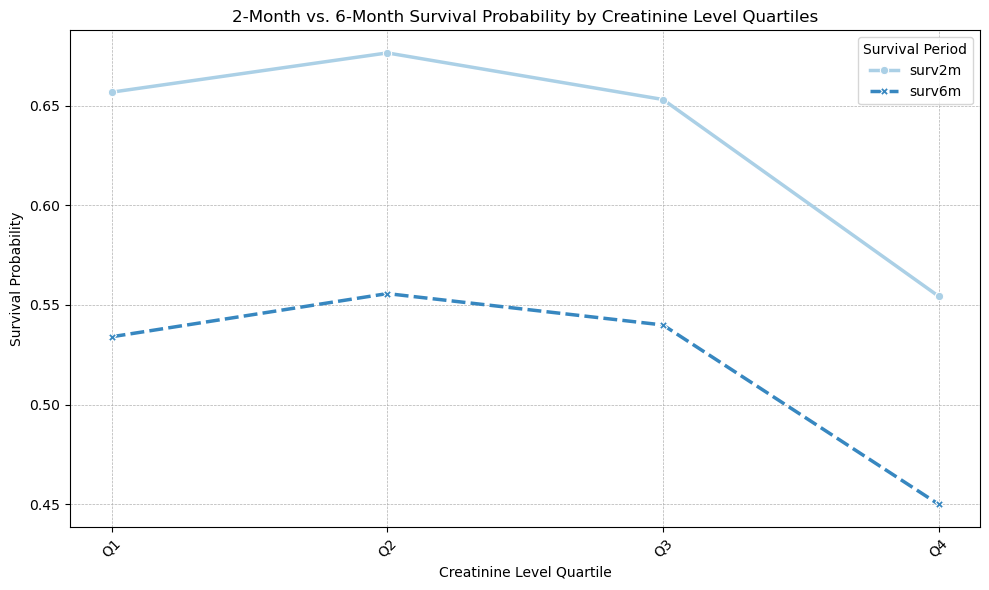

In [46]:
if 'crea' in df.columns:
    df_clean = df.dropna(subset=['crea'])

    df_clean['crea_quartile'] = pd.qcut(df_clean['crea'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

    avg_survival_by_crea = df_clean.groupby('crea_quartile')[['surv2m', 'surv6m']].mean().reset_index()

    avg_survival_by_crea['crea_quartile'] = pd.Categorical(avg_survival_by_crea['crea_quartile'], 
                                                           categories=['Q1', 'Q2', 'Q3', 'Q4'], 
                                                           ordered=True)

    survival_long = pd.melt(avg_survival_by_crea, id_vars=['crea_quartile'], 
                            value_vars=['surv2m', 'surv6m'], 
                            var_name='Survival Period', 
                            value_name='Survival Probability')

    plt.figure(figsize=(10, 6))
    sns.lineplot(data=survival_long, x='crea_quartile', y='Survival Probability', hue='Survival Period', 
                 style='Survival Period', markers=True, palette='Blues', linewidth=2.5)

    plt.title('2-Month vs. 6-Month Survival Probability by Creatinine Level Quartiles')
    plt.xlabel('Creatinine Level Quartile')
    plt.ylabel('Survival Probability')
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', linewidth=0.5)

    # Show the plot
    plt.tight_layout()
    plt.show()
else:
    print("The required column ('crea') is not available in the dataset.")

## 3. White Blood Cell Count (2-Month vs. 6-Month Survival Probability

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3728408826.py:4: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3728408826.py:10: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




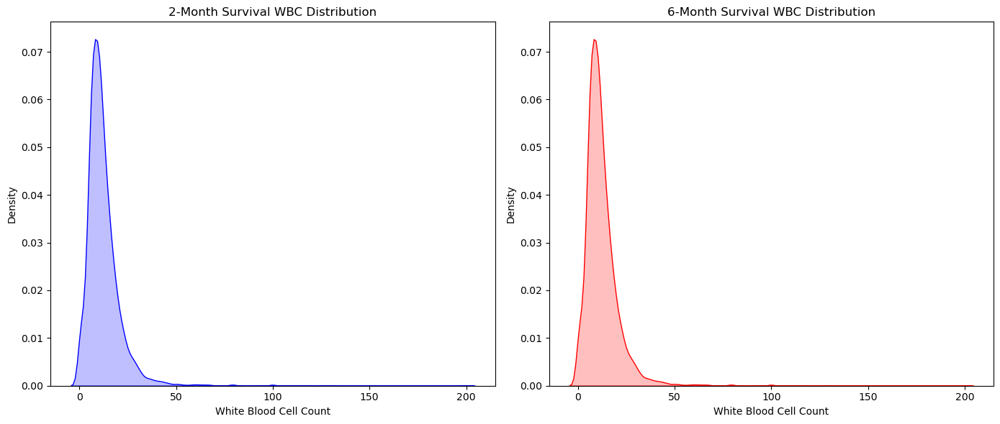

In [47]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df['wblc'], color='blue', shade=True)
plt.title('2-Month Survival WBC Distribution')
plt.xlabel('White Blood Cell Count')
plt.ylabel('Density')

plt.subplot(1, 2, 2)
sns.kdeplot(df['wblc'], color='red', shade=True)
plt.title('6-Month Survival WBC Distribution')
plt.xlabel('White Blood Cell Count')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

## 4. Bilirubin Levels (2-Month vs. 6-Month Survival Probability)

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3745436622.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




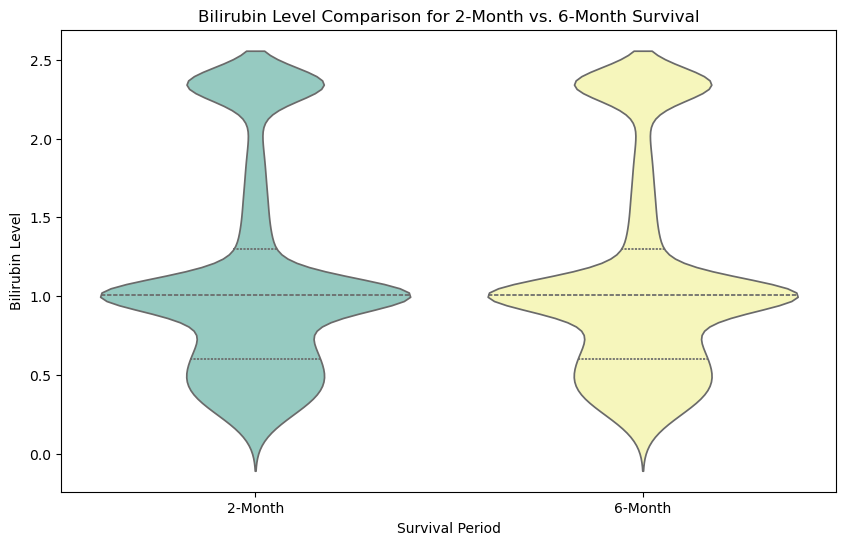

In [48]:
survival_data = pd.DataFrame({
    'Bilirubin Level': df['bili'].tolist() + df['bili'].tolist(),
    'Survival Period': ['2-Month'] * len(df) + ['6-Month'] * len(df)
})
plt.figure(figsize=(10, 6))
sns.violinplot(x='Survival Period', y='Bilirubin Level', data=survival_data, palette='Set3', inner='quartile')
plt.title('Bilirubin Level Comparison for 2-Month vs. 6-Month Survival')
plt.xlabel('Survival Period')
plt.ylabel('Bilirubin Level')
plt.show()

## 5. Severity Score (APS) and Short-Term vs. Long-Term Survival

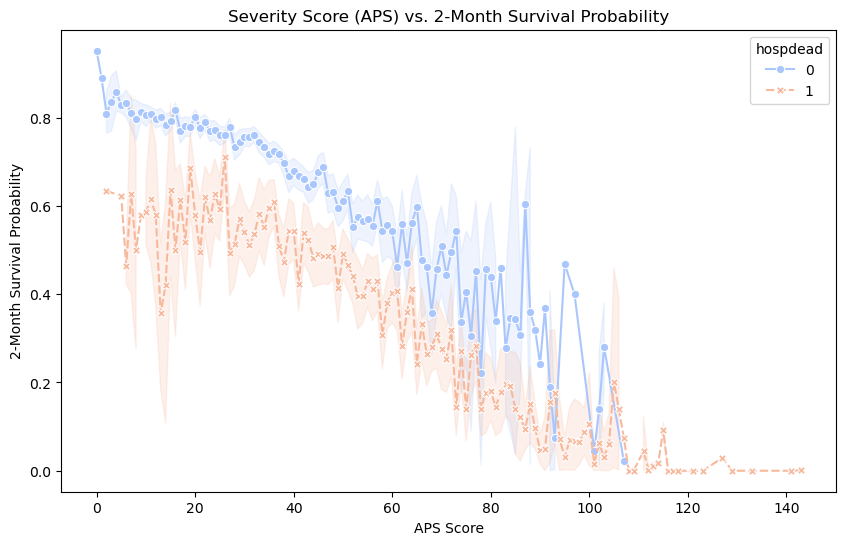

In [49]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='aps', y='surv2m', hue='hospdead', style='hospdead', markers=True, palette='coolwarm')
plt.title('Severity Score (APS) vs. 2-Month Survival Probability')
plt.xlabel('APS Score')
plt.ylabel('2-Month Survival Probability')
plt.show()

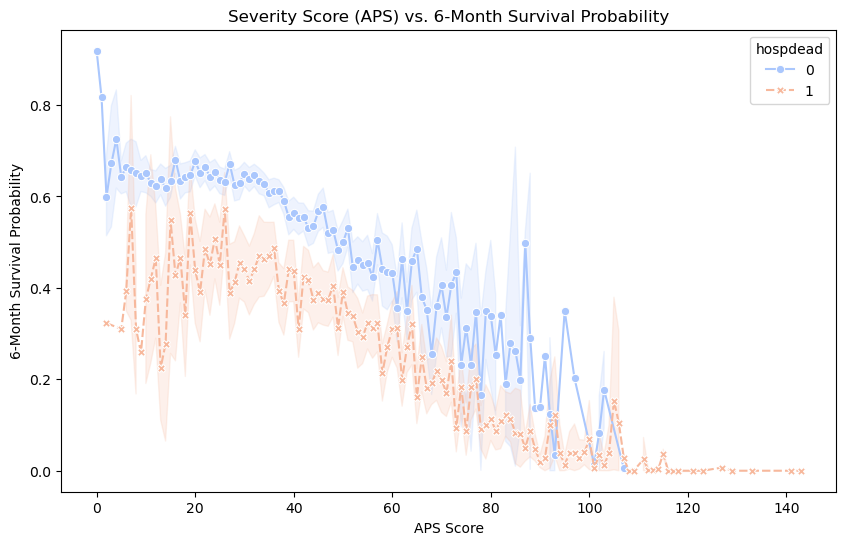

In [50]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='aps', y='surv6m', hue='hospdead', style='hospdead', markers=True, palette='coolwarm')
plt.title('Severity Score (APS) vs. 6-Month Survival Probability')
plt.xlabel('APS Score')
plt.ylabel('6-Month Survival Probability')
plt.show()

## 6. Comorbidity vs. Survival Analysis

In [51]:
alt.renderers.enable('default')

survival_agg = df.groupby('num.co')[['surv2m', 'surv6m']].mean().reset_index()

survival_long = pd.melt(survival_agg, id_vars=['num.co'], value_vars=['surv2m', 'surv6m'],
                        var_name='Survival Period', value_name='Average Survival Probability')

chart = alt.Chart(survival_long).mark_bar().encode(
    x=alt.X('num.co:O', title='Number of Comorbidities'),
    y=alt.Y('Average Survival Probability:Q', title='Average Survival Probability'),
    color='Survival Period:N',
    column='Survival Period:N',
    tooltip=['num.co', 'Average Survival Probability']
).properties(
    title='Average Survival Probability by Number of Comorbidities (2-Month vs. 6-Month)',
    width=150,
    height=400
).interactive()

chart

/Users/sarahmokhtar/Applications/anaconda3/lib/python3.12/site-packages/altair/utils/core.py:395: FutureWarning:

the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.



alt.Chart(...)

## 7. Mean Blood Pressure (meanbp) vs. Survival Probability 

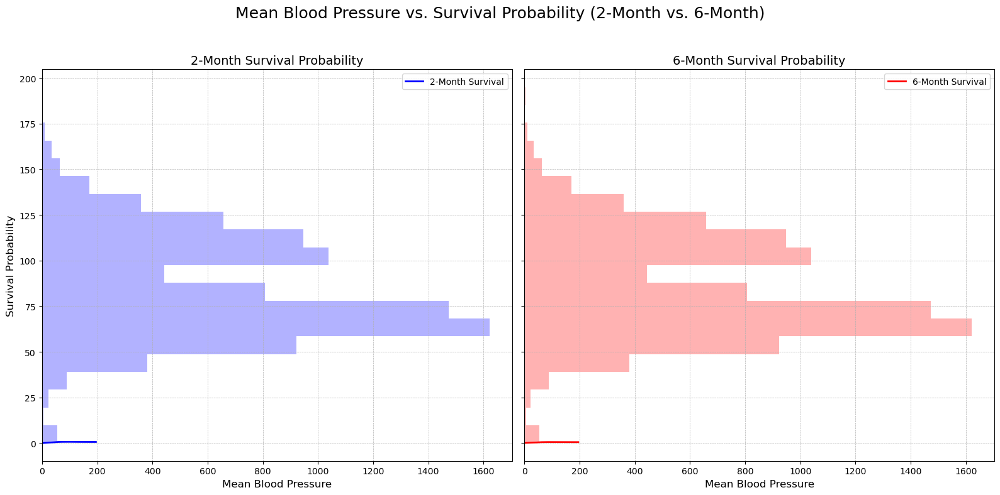

In [52]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
fig.suptitle('Mean Blood Pressure vs. Survival Probability (2-Month vs. 6-Month)', fontsize=18)

x_2m = df['meanbp'].dropna().values
y_2m = df['surv2m'].dropna().values

lowess_2m = sm.nonparametric.lowess(y_2m, x_2m, frac=0.3)
x_2m_smooth, y_2m_smooth = zip(*lowess_2m)

ax1.plot(x_2m_smooth, y_2m_smooth, color='blue', lw=2, label='2-Month Survival')
ax1.hist(df['meanbp'].dropna(), bins=20, alpha=0.3, color='blue', orientation='horizontal')
ax1.set_title('2-Month Survival Probability', fontsize=14)
ax1.set_xlabel('Mean Blood Pressure', fontsize=12)
ax1.set_ylabel('Survival Probability', fontsize=12)
ax1.legend()
ax1.grid(visible=True, linestyle='--', linewidth=0.5)

x_6m = df['meanbp'].dropna().values
y_6m = df['surv6m'].dropna().values

lowess_6m = sm.nonparametric.lowess(y_6m, x_6m, frac=0.3)
x_6m_smooth, y_6m_smooth = zip(*lowess_6m)

ax2.plot(x_6m_smooth, y_6m_smooth, color='red', lw=2, label='6-Month Survival')
ax2.hist(df['meanbp'].dropna(), bins=20, alpha=0.3, color='red', orientation='horizontal')
ax2.set_title('6-Month Survival Probability', fontsize=14)
ax2.set_xlabel('Mean Blood Pressure', fontsize=12)
ax2.legend()
ax2.grid(visible=True, linestyle='--', linewidth=0.5)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


## 8. Races vs. Survival Probability

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3182842131.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



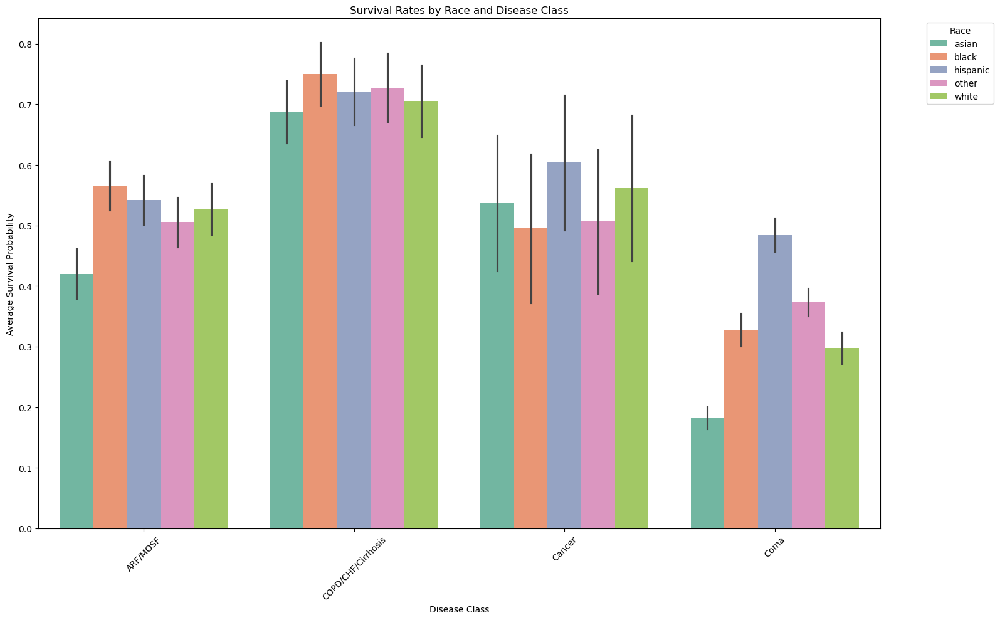

In [53]:
if 'race' in df.columns and 'dzclass' in df.columns:
    race_disease_survival_class = df.groupby(['race', 'dzclass'])[['surv2m', 'surv6m']].mean().reset_index()

    race_disease_class_long = pd.melt(race_disease_survival_class, id_vars=['race', 'dzclass'], value_vars=['surv2m', 'surv6m'],
                                      var_name='Survival Period', value_name='Average Survival Probability')

    plt.figure(figsize=(16, 10))

    sns.barplot(data=race_disease_class_long, x='dzclass', y='Average Survival Probability', hue='race', palette='Set2')
    plt.title('Survival Rates by Race and Disease Class')
    plt.xlabel('Disease Class')
    plt.ylabel('Average Survival Probability')
    plt.xticks(rotation=45)
    plt.legend(title='Race', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()
else:
    print("The required columns ('race' and 'dzclass') are not available in the dataset.")


## 9. Survival Probability vs. Disease Group

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/1710015055.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



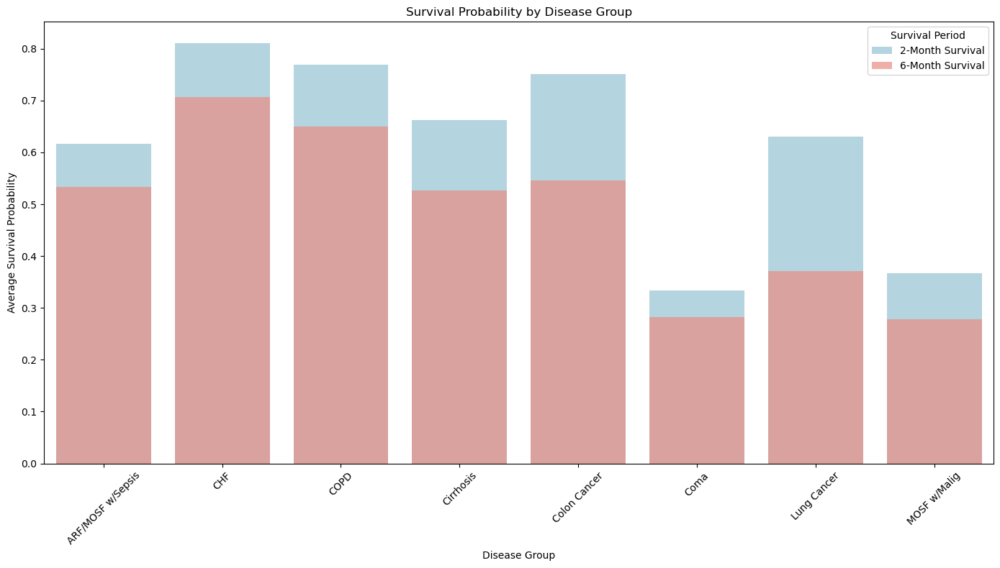

In [54]:
if 'dzgroup' in df.columns:
    dzgroup_survival = df.groupby('dzgroup')[['surv2m', 'surv6m']].mean().reset_index()

    plt.figure(figsize=(14, 8))

    sns.barplot(data=dzgroup_survival, x='dzgroup', y='surv2m', color='lightblue', label='2-Month Survival')
    sns.barplot(data=dzgroup_survival, x='dzgroup', y='surv6m', color='salmon', alpha=0.7, label='6-Month Survival')

    plt.title('Survival Probability by Disease Group')
    plt.xlabel('Disease Group')
    plt.ylabel('Average Survival Probability')
    plt.xticks(rotation=45)
    plt.legend(title='Survival Period')

    plt.tight_layout()
    plt.show()
else:
    print("The required column ('dzgroup') is not available in the dataset.")

# Mortality Analysis 

## 1. Age vs. Mortality

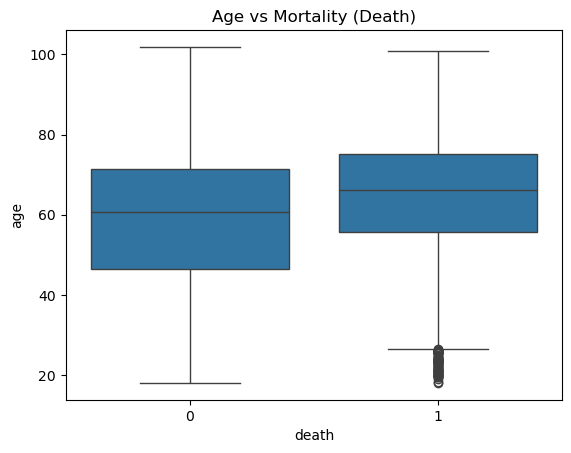

In [55]:
sns.boxplot(x='death', y='age', data=df)
plt.title('Age vs Mortality (Death)')
plt.show()

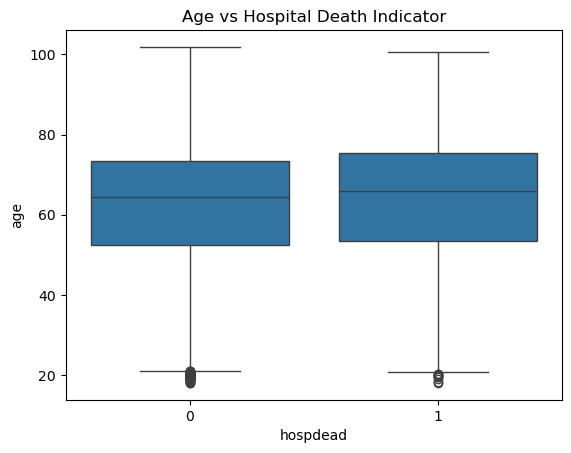

In [56]:
sns.boxplot(x='hospdead', y='age', data=df)
plt.title('Age vs Hospital Death Indicator')
plt.show()

## 2. Sex vs. Mortality

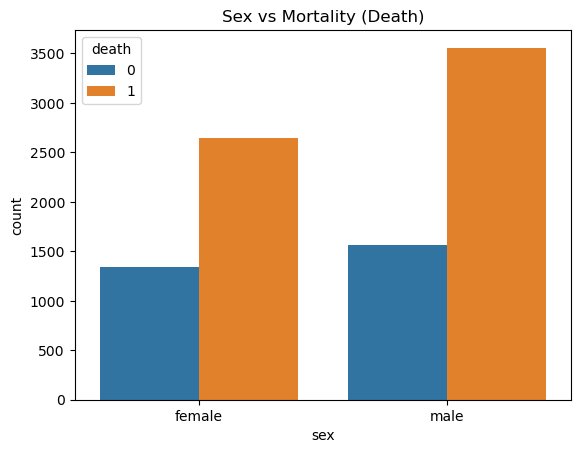

In [57]:
sns.countplot(x='sex', hue='death', data=df)
plt.title('Sex vs Mortality (Death)')
plt.show()

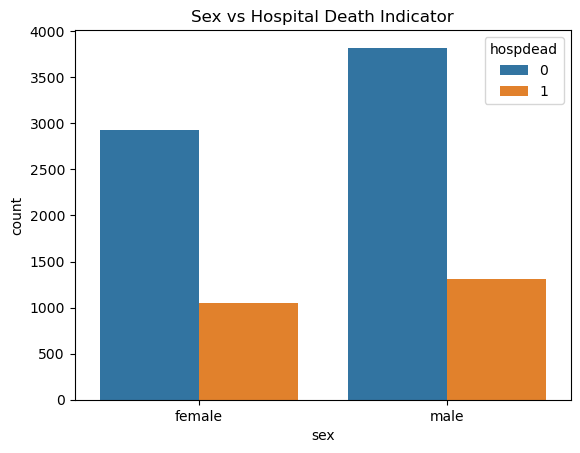

In [58]:
sns.countplot(x='sex', hue='hospdead', data=df)
plt.title('Sex vs Hospital Death Indicator')
plt.show()

## 3. Disease Group (dzgroup) vs. Mortality

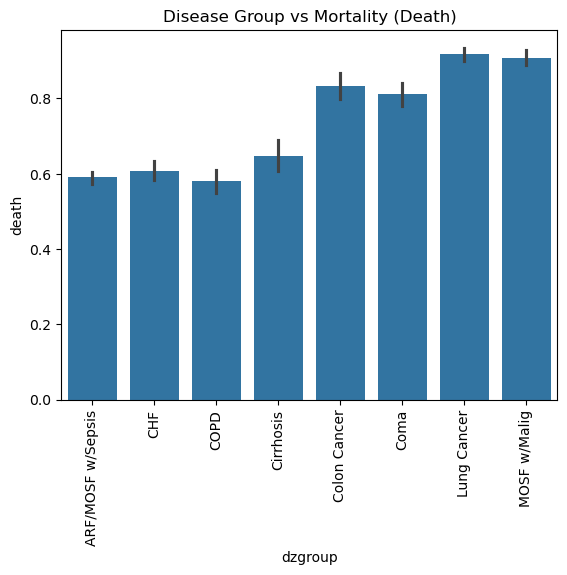

In [59]:
sns.barplot(x='dzgroup', y='death', data=df, estimator=np.mean)
plt.title('Disease Group vs Mortality (Death)')
plt.xticks(rotation=90)
plt.show()

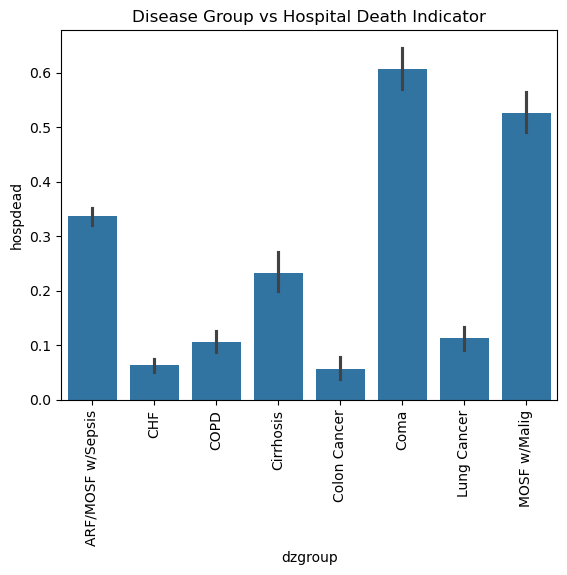

In [60]:
sns.barplot(x='dzgroup', y='hospdead', data=df, estimator=np.mean)
plt.title('Disease Group vs Hospital Death Indicator')
plt.xticks(rotation=90)
plt.show()

## 4. Number of Comorbidites (num.co) vs. Mortality

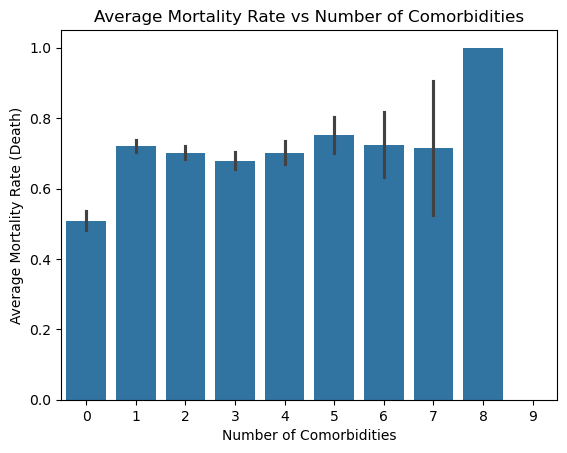

In [61]:
sns.barplot(x='num.co', y='death', data=df, estimator=np.mean)
plt.title('Average Mortality Rate vs Number of Comorbidities')
plt.xlabel('Number of Comorbidities')
plt.ylabel('Average Mortality Rate (Death)')
plt.show()

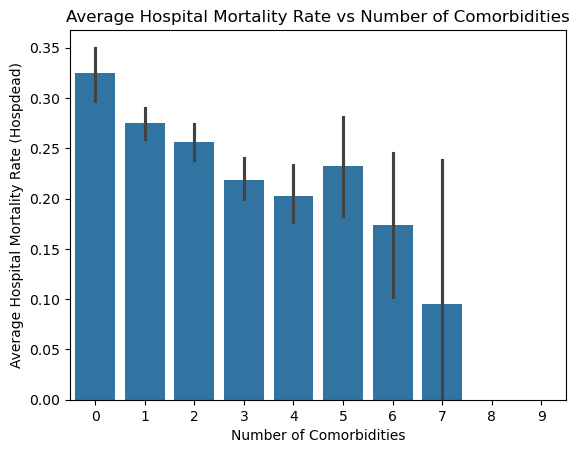

In [62]:
sns.barplot(x='num.co', y='hospdead', data=df, estimator=np.mean)
plt.title('Average Hospital Mortality Rate vs Number of Comorbidities')
plt.xlabel('Number of Comorbidities')
plt.ylabel('Average Hospital Mortality Rate (Hospdead)')
plt.show()

## 5. Diabetes vs. Mortality 

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/3316969809.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



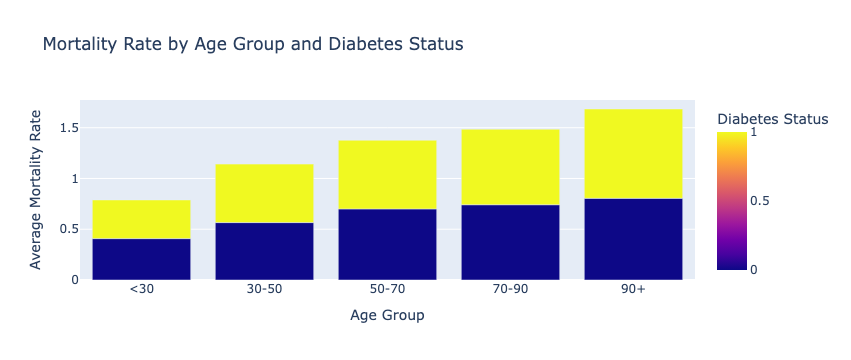

In [101]:
bins = [0, 30, 50, 70, 90, 120]  
labels = ['<30', '30-50', '50-70', '70-90', '90+']  
df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)

df_grouped = df.groupby(['age_group', 'diabetes'])['death'].mean().reset_index()

import plotly.express as px
fig = px.bar(df_grouped, x='age_group', y='death', color='diabetes',
             labels={'age_group': 'Age Group', 'death': 'Average Mortality Rate', 'diabetes': 'Diabetes Status'},
             barmode='group', title='Mortality Rate by Age Group and Diabetes Status')
fig.show()

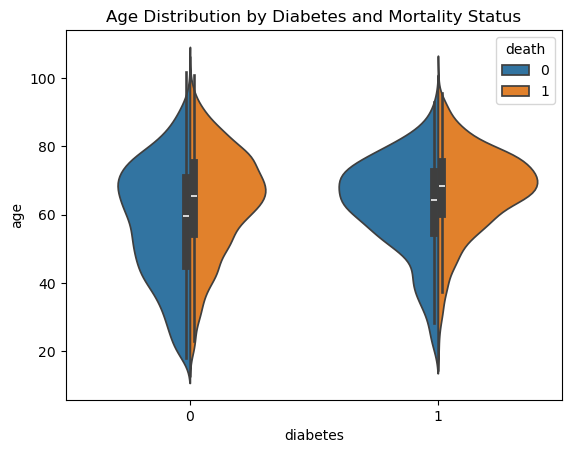

In [65]:
sns.violinplot(x='diabetes', y='age', hue='death', data=df, split=True)
plt.title('Age Distribution by Diabetes and Mortality Status')
plt.show()

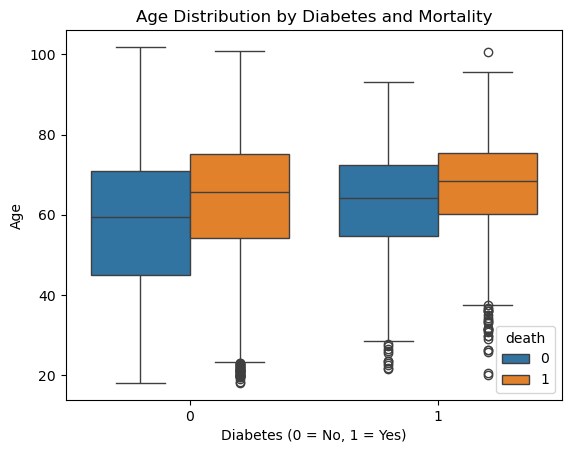

In [67]:
sns.boxplot(x='diabetes', y='age', hue='death', data=df)
plt.title('Age Distribution by Diabetes and Mortality')
plt.xlabel('Diabetes (0 = No, 1 = Yes)')
plt.ylabel('Age')
plt.show()

## 6. Cancer (ca) vs Mortality

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/2249189032.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



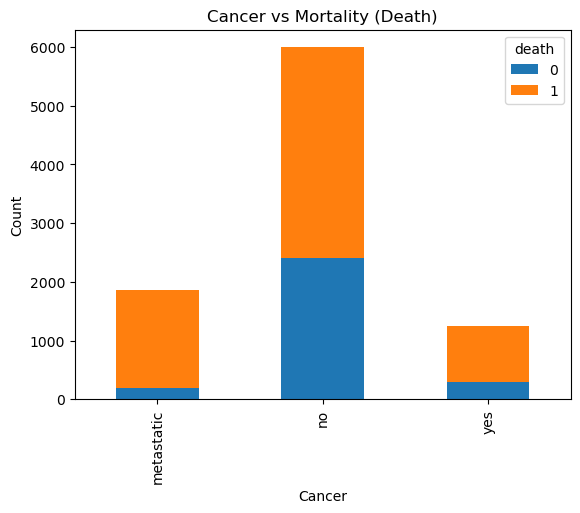

In [68]:
cancer_counts = df.groupby(['ca', 'death']).size().unstack()
cancer_counts.plot(kind='bar', stacked=True)
plt.title('Cancer vs Mortality (Death)')
plt.xlabel('Cancer')
plt.ylabel('Count')
plt.show()

## 7. Length of Stay vs. Mortality - maybe delete second graph as the labels are all bunched together or edit it

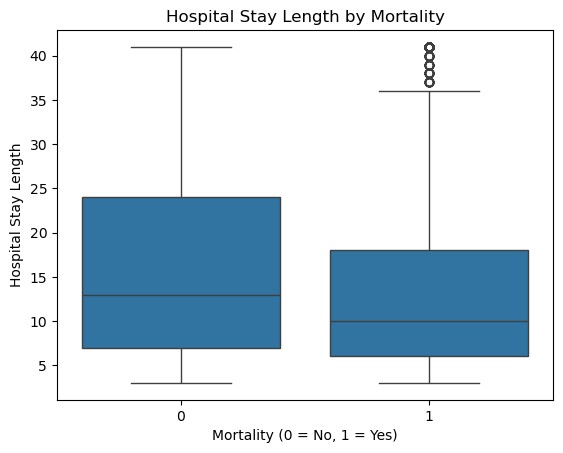

In [69]:
sns.boxplot(x='death', y='slos', data=df)
plt.title('Hospital Stay Length by Mortality')
plt.xlabel('Mortality (0 = No, 1 = Yes)')
plt.ylabel('Hospital Stay Length')
plt.show()

## 8. Survival Periods (surv2m, surv6m) vs. Mortality

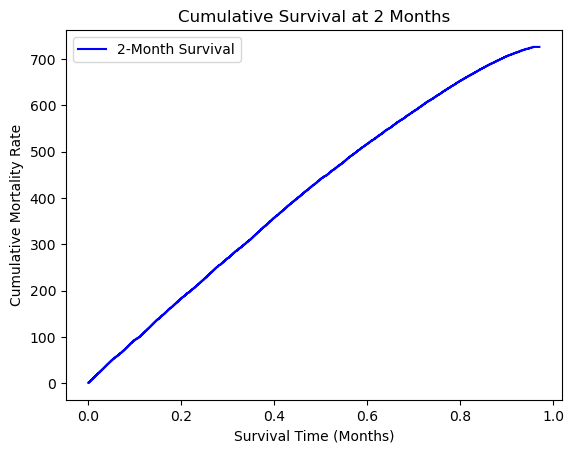

In [71]:
surv2m_proportion = df.groupby('surv2m')['death'].mean().cumsum()
plt.step(surv2m_proportion.index, surv2m_proportion, where='mid', label='2-Month Survival', color='blue')
plt.title('Cumulative Survival at 2 Months')
plt.xlabel('Survival Time (Months)')
plt.ylabel('Cumulative Mortality Rate')
plt.legend()
plt.show()

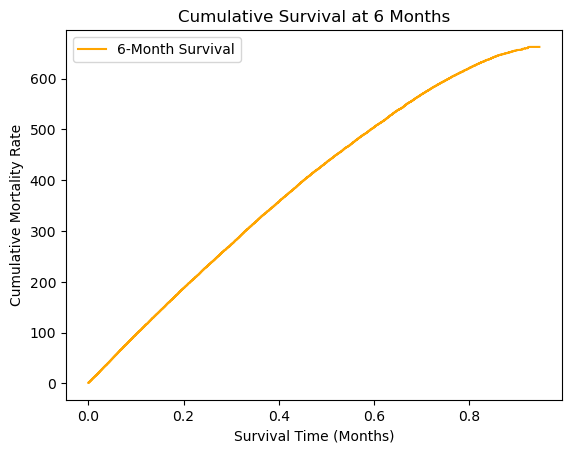

In [72]:
surv6m_proportion = df.groupby('surv6m')['death'].mean().cumsum()
plt.step(surv6m_proportion.index, surv6m_proportion, where='mid', label='6-Month Survival', color='orange')
plt.title('Cumulative Survival at 6 Months')
plt.xlabel('Survival Time (Months)')
plt.ylabel('Cumulative Mortality Rate')
plt.legend()
plt.show()

## 9. Total Costs (totcst) vs. Mortality

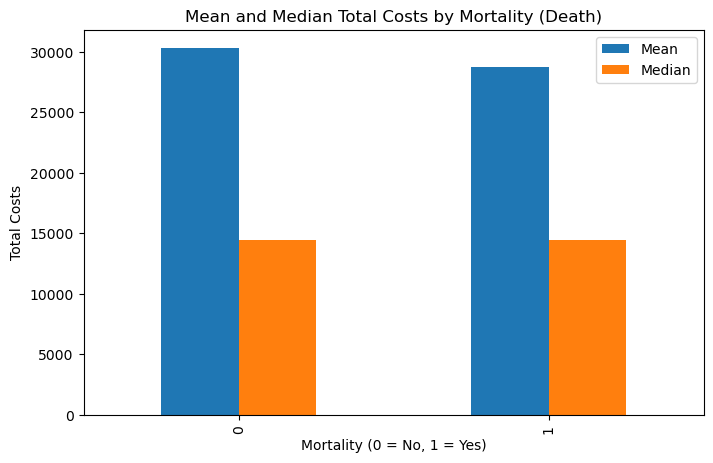

In [73]:
grouped = df.groupby('death')['totcst'].agg(['mean', 'median']).reset_index()

grouped.plot(x='death', kind='bar', figsize=(8, 5))
plt.title('Mean and Median Total Costs by Mortality (Death)')
plt.xlabel('Mortality (0 = No, 1 = Yes)')
plt.ylabel('Total Costs')
plt.legend(['Mean', 'Median'])
plt.show()

## 10. Mean Blood Pressure (meanbp) vs. Mortality

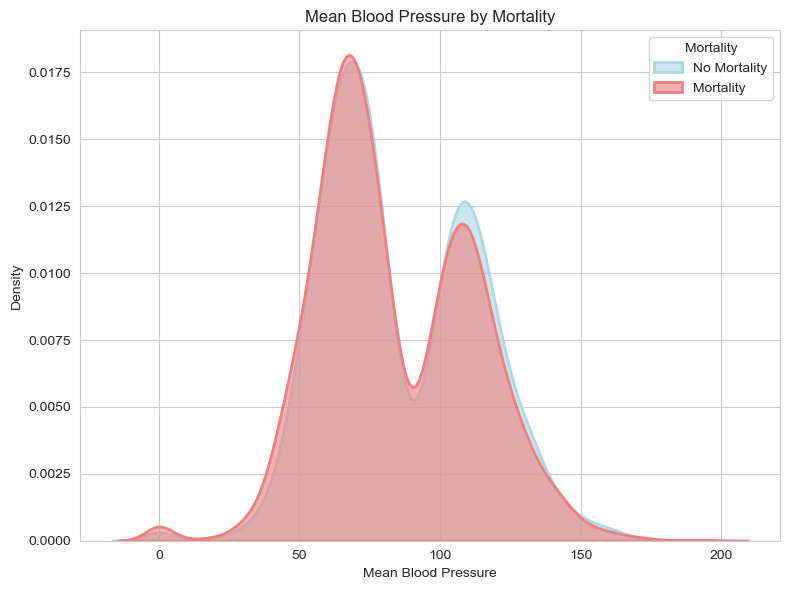

In [74]:
sns.set_style('whitegrid')
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df[df['death'] == 0], x='meanbp', fill=True, color='lightblue', alpha=0.6, linewidth=2)
sns.kdeplot(data=df[df['death'] == 1], x='meanbp', fill=True, color='lightcoral', alpha=0.6, linewidth=2)
plt.title('Mean Blood Pressure by Mortality')
plt.xlabel('Mean Blood Pressure')
plt.ylabel('Density')
plt.legend(['No Mortality', 'Mortality'], title='Mortality')
plt.tight_layout()
plt.show()

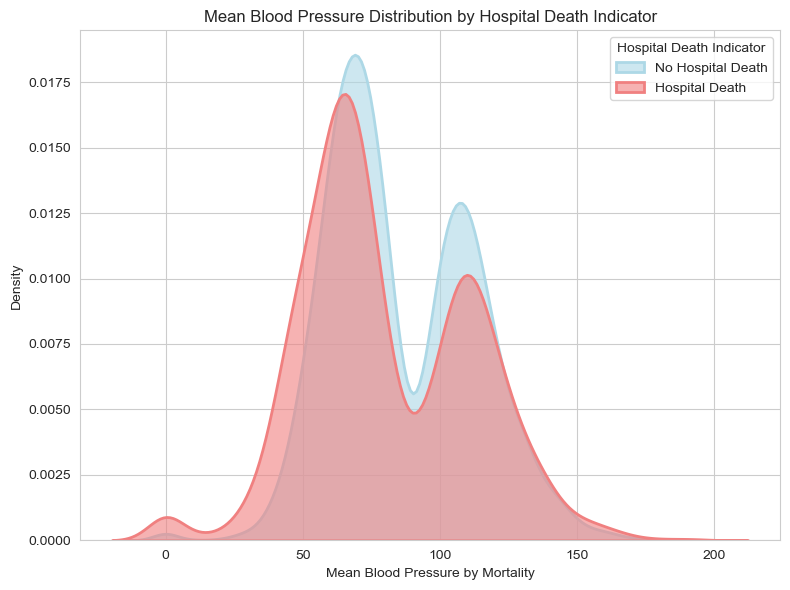

In [75]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df[df['hospdead'] == 0], x='meanbp', fill=True, color='lightblue', alpha=0.6, linewidth=2)
sns.kdeplot(data=df[df['hospdead'] == 1], x='meanbp', fill=True, color='lightcoral', alpha=0.6, linewidth=2)
plt.title('Mean Blood Pressure Distribution by Hospital Death Indicator')
plt.xlabel('Mean Blood Pressure by Mortality')
plt.ylabel('Density')
plt.legend(['No Hospital Death', 'Hospital Death'], title='Hospital Death Indicator')
plt.tight_layout()
plt.show()

## 11. Glucose Levels (glucose) vs. Mortality

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/743153854.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



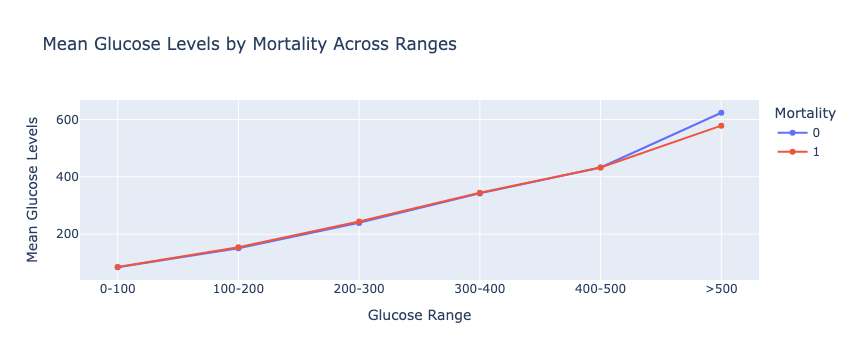

In [76]:
bins = [0, 100, 200, 300, 400, 500, 1000]
df['glucose_bin'] = pd.cut(df['glucose'], bins=bins, labels=['0-100', '100-200', '200-300', '300-400', '400-500', '>500'])

#Calculate the mean glucose levels for group and plot
grouped = df.groupby(['glucose_bin', 'death']).glucose.mean().reset_index()

fig = px.line(grouped, x='glucose_bin', y='glucose', color='death',
              labels={'glucose_bin': 'Glucose Range', 'glucose': 'Mean Glucose Levels', 'death': 'Mortality'},
              markers=True, title='Mean Glucose Levels by Mortality Across Ranges')
fig.update_traces(hovertemplate='Glucose Bin: %{x}<br>Mean Glucose: %{y}')
fig.show()

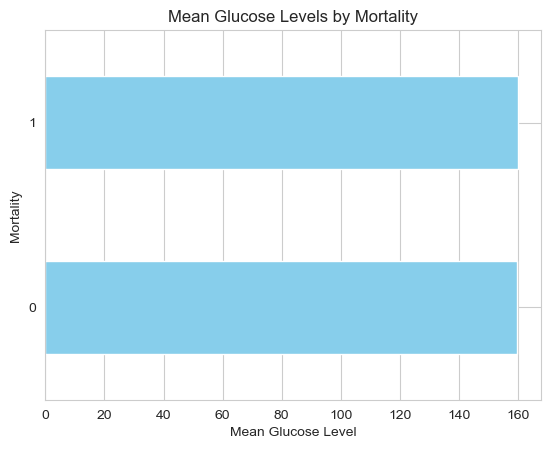

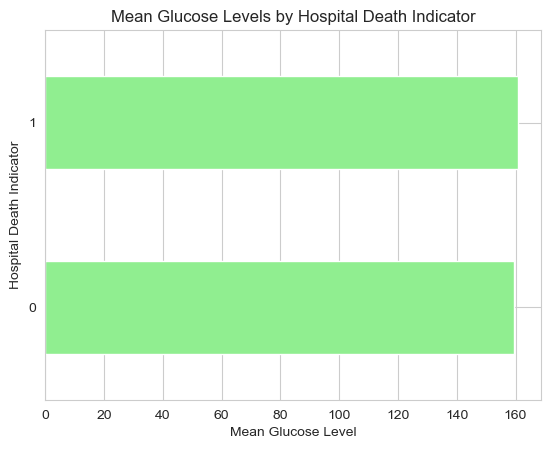

In [77]:
mean_glucose_death = df.groupby('death')['glucose'].mean().reset_index()
mean_glucose_hospdead = df.groupby('hospdead')['glucose'].mean().reset_index()

mean_glucose_death.plot.barh(x='death', y='glucose', legend=False, color='skyblue')
plt.title('Mean Glucose Levels by Mortality')
plt.xlabel('Mean Glucose Level')
plt.ylabel('Mortality')
plt.show()

mean_glucose_hospdead.plot.barh(x='hospdead', y='glucose', legend=False, color='lightgreen')
plt.title('Mean Glucose Levels by Hospital Death Indicator')
plt.xlabel('Mean Glucose Level')
plt.ylabel('Hospital Death Indicator')
plt.show()

## 12. Gender Differences in Disease Group Mortality

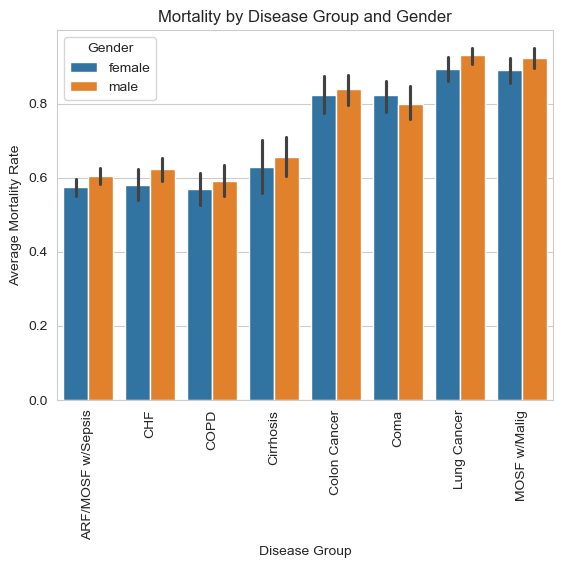

In [78]:
sns.barplot(x='dzgroup', y='death', hue='sex', data=df, estimator=np.mean)
plt.title('Mortality by Disease Group and Gender')
plt.xlabel('Disease Group')
plt.ylabel('Average Mortality Rate')
plt.xticks(rotation=90)
plt.legend(title='Gender')
plt.show()

/var/folders/c5/gtkq3yw10pdb1lcwk5114kd80000gn/T/ipykernel_13514/993578835.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



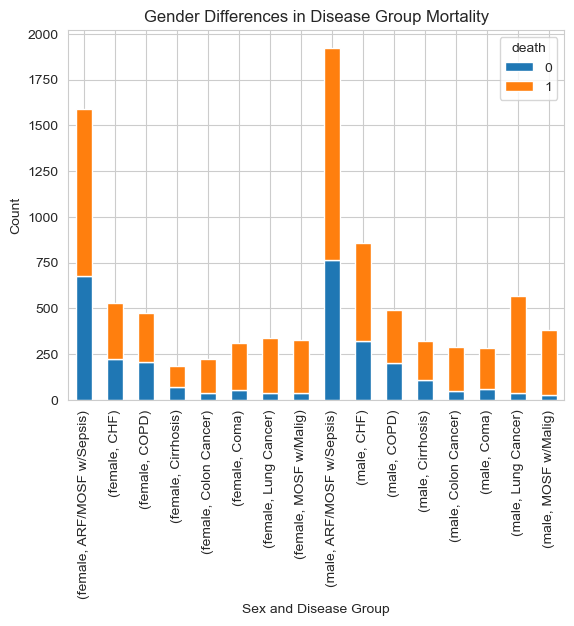

In [79]:
gender_dzgroup_counts = df.groupby(['sex', 'dzgroup', 'death']).size().unstack().fillna(0)
gender_dzgroup_counts.plot(kind='bar', stacked=True)
plt.title('Gender Differences in Disease Group Mortality')
plt.xlabel('Sex and Disease Group')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

## 13. Comorbidites vs. Mortality

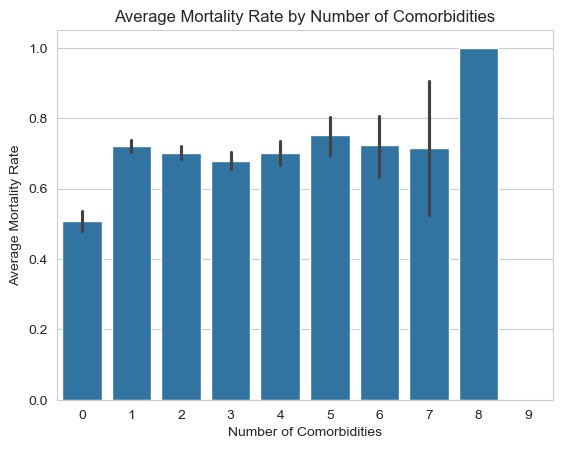

In [80]:
sns.barplot(x='num.co', y='death', data=df, estimator=np.mean)
plt.title('Average Mortality Rate by Number of Comorbidities')
plt.xlabel('Number of Comorbidities')
plt.ylabel('Average Mortality Rate')
plt.show()

In [81]:
# Create a contingency table to perform a Chi-square test
contingency_table = pd.crosstab(df['num.co'], df['death'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value for Number of Comorbidities vs Mortality: {p}")

Chi-Square Test p-value for Number of Comorbidities vs Mortality: 2.2544988136230464e-38


In [82]:
# Completing a logistic regression code to analyse the relationship 
# between mortality and other predictors

X = df[['num.co', 'diabetes', 'dementia', 'age_group', 'edu', 'sex', 'race', 'dzgroup']]
y = df['death']

df_clean = pd.concat([X, y], axis=1).dropna()
X = df_clean[['num.co', 'diabetes', 'dementia', 'age_group', 'edu', 'sex', 'race', 'dzgroup']]
y = df_clean['death']

X = pd.get_dummies(X, drop_first=True)

X = X.apply(pd.to_numeric)
y = pd.to_numeric(y)

X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)

y = y.loc[X.index]

X = X.to_numpy(dtype=np.float64)
y = y.to_numpy(dtype=np.float64)

X = sm.add_constant(X)

model = sm.Logit(y, X)
result = model.fit()
print(result.summary())


Optimization terminated successfully.
         Current function value: 0.555011
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 9105
Model:                          Logit   Df Residuals:                     9084
Method:                           MLE   Df Model:                           20
Date:                Mon, 02 Dec 2024   Pseudo R-squ.:                  0.1135
Time:                        18:16:42   Log-Likelihood:                -5053.4
converged:                       True   LL-Null:                       -5700.4
Covariance Type:            nonrobust   LLR p-value:                5.658e-262
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4335      0.381     -1.138      0.255      -1.180       0.313
x1             0.2235      0.

In [83]:
X = df[['num.co', 'diabetes', 'dementia', 'age_group', 'edu', 'sex', 'race', 'dzgroup']]
y = df['death']

df_clean = pd.concat([X, y], axis=1).dropna()
X = df_clean[['num.co', 'diabetes', 'dementia', 'age_group', 'edu', 'sex', 'race', 'dzgroup']]
y = df_clean['death']

X = pd.get_dummies(X, drop_first=True)

X = X.apply(pd.to_numeric, errors='coerce')
y = pd.to_numeric(y, errors='coerce')

X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)

y = y.loc[X.index]

interaction_columns = ['age_group_50-70', 'diabetes', 'num.co']
for col in interaction_columns:
    if col not in X.columns:
        raise ValueError(f"Column '{col}' not found in DataFrame.")

X['age_num_co_interaction'] = X['age_group_50-70'] * X['num.co']
X['diabetes_num_co_interaction'] = X['diabetes'] * X['num.co']

X = sm.add_constant(X)

print("Data types in X:\n", X.dtypes)
print("Data types in y:\n", y.dtypes)

X = X.to_numpy(dtype=np.float64)
y = y.to_numpy(dtype=np.float64)

result = sm.Logit(y, X).fit()
print(result.summary())

Data types in X:
 const                          float64
num.co                           int64
diabetes                         int64
dementia                         int64
edu                            float64
age_group_30-50                   bool
age_group_50-70                   bool
age_group_70-90                   bool
age_group_90+                     bool
sex_male                          bool
race_black                        bool
race_hispanic                     bool
race_other                        bool
race_white                        bool
dzgroup_CHF                       bool
dzgroup_COPD                      bool
dzgroup_Cirrhosis                 bool
dzgroup_Colon Cancer              bool
dzgroup_Coma                      bool
dzgroup_Lung Cancer               bool
dzgroup_MOSF w/Malig              bool
age_num_co_interaction           int64
diabetes_num_co_interaction      int64
dtype: object
Data types in y:
 int64
Optimization terminated successfully.
         

In [84]:
# Split data by mortality (0 = no death, 1 = death) to perform a T-test
mortality_0 = df[df['death'] == 0]['num.co']
mortality_1 = df[df['death'] == 1]['num.co']

t_stat, p_val = ttest_ind(mortality_0, mortality_1)
print(f"T-test for Number of Comorbidities vs Mortality: t-statistic = {t_stat}, p-value = {p_val}")

T-test for Number of Comorbidities vs Mortality: t-statistic = -6.563841297785779, p-value = 5.530187868225739e-11


In [85]:
# T-test for number of comorbidities by mortality
t_stat, p_val = ttest_ind(df[df['death'] == 0]['num.co'], df[df['death'] == 1]['num.co'])
print(f"T-test for Number of Comorbidities by Mortality: t-statistic = {t_stat:.4f}, p-value = {p_val:.4e}")

T-test for Number of Comorbidities by Mortality: t-statistic = -6.5638, p-value = 5.5302e-11


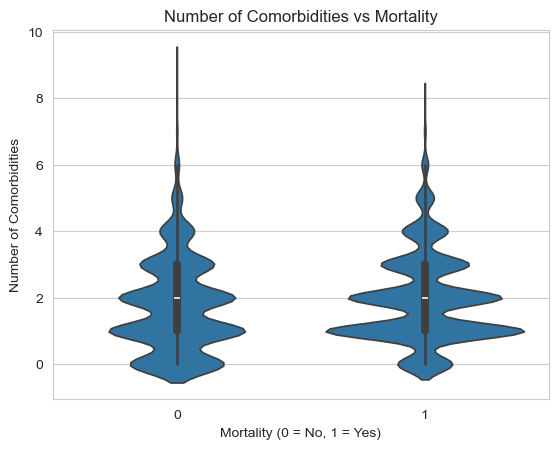

In [86]:
sns.violinplot(x='death', y='num.co', data=df)
plt.title('Number of Comorbidities vs Mortality')
plt.xlabel('Mortality (0 = No, 1 = Yes)')
plt.ylabel('Number of Comorbidities')
plt.show()

# Disease Insights Analysis

## 1. Number of Comorbidites vs. Mortality 

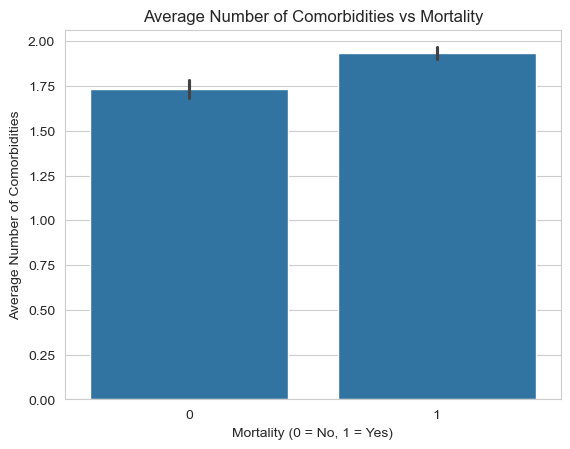

In [87]:
sns.barplot(x='death', y='num.co', data=df, estimator=np.mean)
plt.title('Average Number of Comorbidities vs Mortality')
plt.xlabel('Mortality (0 = No, 1 = Yes)')
plt.ylabel('Average Number of Comorbidities')
plt.show()

## 2. Diabetes vs Mortality

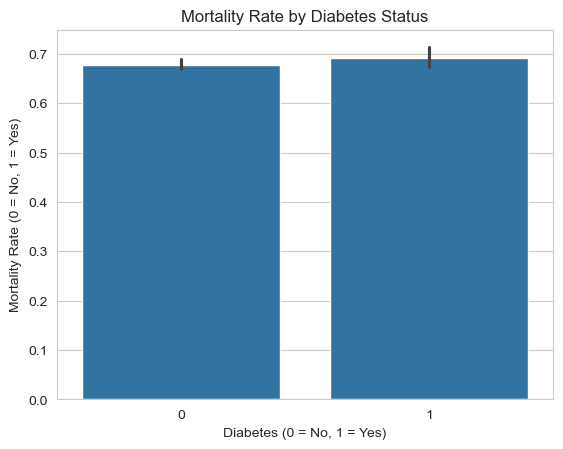

In [88]:
sns.barplot(x='diabetes', y='death', data=df, estimator=np.mean)
plt.title('Mortality Rate by Diabetes Status')
plt.xlabel('Diabetes (0 = No, 1 = Yes)')
plt.ylabel('Mortality Rate (0 = No, 1 = Yes)')
plt.show()

# 3. Dementia vs. Mortality

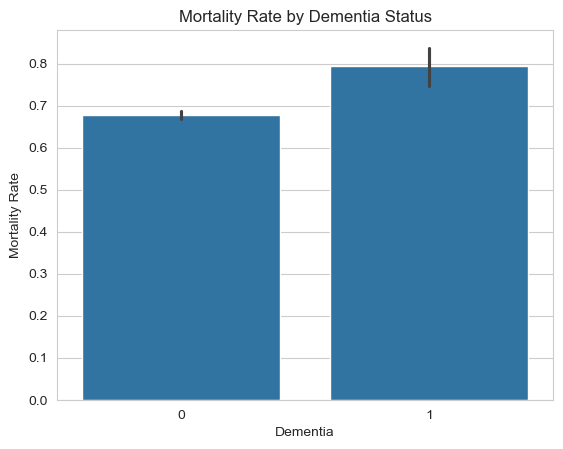

In [89]:
sns.barplot(x='dementia', y='death', data=df, estimator=np.mean)
plt.title('Mortality Rate by Dementia Status')
plt.xlabel('Dementia')
plt.ylabel('Mortality Rate')
plt.show()

## 4. Age Group and Diabetes vs. Mortality

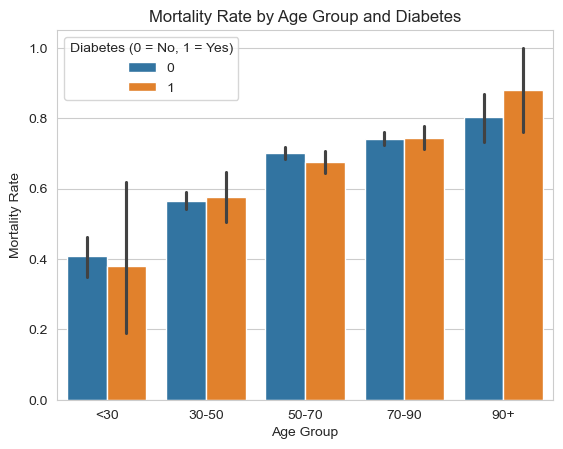

In [90]:
sns.barplot(x='age_group', y='death', hue='diabetes', data=df, estimator=np.mean)
plt.title('Mortality Rate by Age Group and Diabetes')
plt.xlabel('Age Group')
plt.ylabel('Mortality Rate')
plt.legend(title='Diabetes (0 = No, 1 = Yes)')
plt.show()

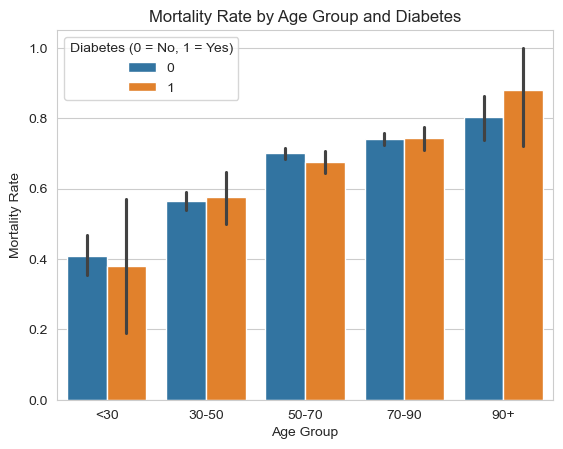

In [91]:
sns.barplot(x='age_group', y='death', hue='diabetes', data=df, estimator=np.mean)
plt.title('Mortality Rate by Age Group and Diabetes')
plt.xlabel('Age Group')
plt.ylabel('Mortality Rate')
plt.legend(title='Diabetes (0 = No, 1 = Yes)')
plt.show()

## Comorbidites vs. Age Group 

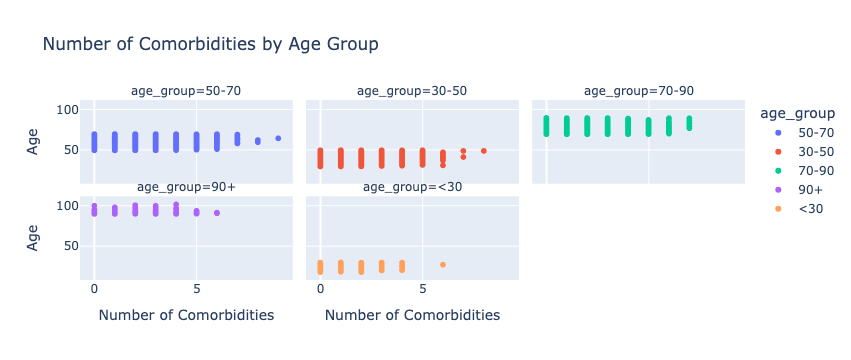

In [92]:
fig = px.scatter(df, x='num.co', y='age', color='age_group',
                 facet_col='age_group', facet_col_wrap=3,
                 labels={'num.co': 'Number of Comorbidities', 'age': 'Age'},
                 title='Number of Comorbidities by Age Group')
fig.show()

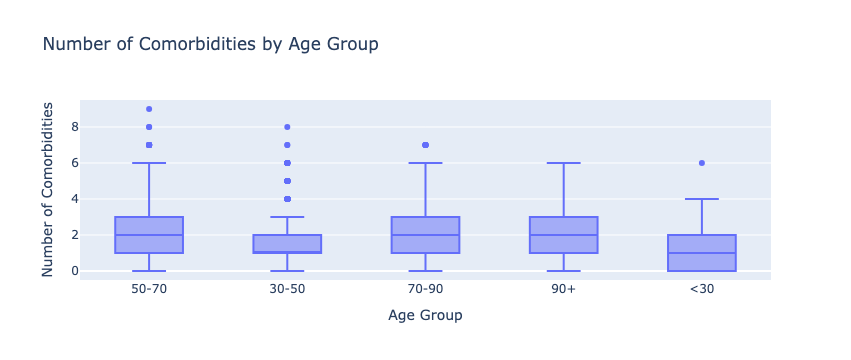

In [94]:
fig = px.box(df, x='age_group', y='num.co',
             labels={'age_group': 'Age Group', 'num.co': 'Number of Comorbidities'},
             title='Number of Comorbidities by Age Group')
fig.show()

## Comorbities vs. Mortality

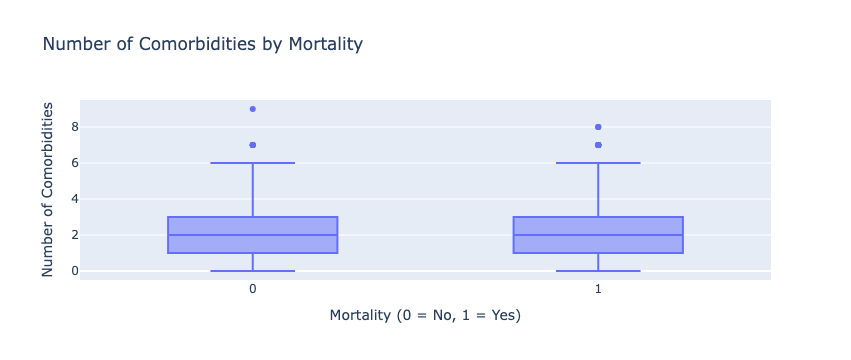

In [95]:
fig = px.box(df, x='death', y='num.co', 
             labels={'death': 'Mortality (0 = No, 1 = Yes)', 
                     'num.co': 'Number of Comorbidities'},
             title='Number of Comorbidities by Mortality')
fig.show()